<a href="https://colab.research.google.com/github/nattntn/DataPreparation_ForDeeptooth/blob/main/Thesis/Thesis_load_data_U2M_R1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Import data set (เรียกใช้ CSV)

In [1]:
import pandas as pd
import shutil
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import io
import cv2
import PIL
import os
import glob
import numpy as np
import sys


In [2]:
#เชื่อม google drive
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


# path original

In [3]:
original= pd.read_csv (r'/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Model/Multi_task(Age)(7-25)/Table_test_Predict.csv')

# load data from CVAT

## load

### 10Y

In [4]:
# โหลดไฟล์ JSON
import json
with open("/content/gdrive/MyDrive/DentDiscovering/UpperSecondMolar/Polygon/10Y.json", "r") as file:
    data = json.load(file)


In [5]:
import pandas as pd

# สร้าง DataFrame สำหรับแต่ละส่วน
categories_df = pd.DataFrame(data["categories"])
images_df = pd.DataFrame(data["images"])
annotations_df = pd.DataFrame(data["annotations"])

# รวมข้อมูลจากทุก DataFrame
combined_data = annotations_df.merge(
    categories_df, how="left", left_on="category_id", right_on="id"
).merge(
    images_df, how="left", left_on="image_id", right_on="id", suffixes=("_category", "_image")
)

# ลบคอลัมน์ที่ซ้ำซ้อนหรือไม่จำเป็น
final_combined_table = combined_data.drop(
    columns=["id", "license", "flickr_url", "coco_url", "date_captured"]#"id_category", "id_image",
)

# แสดง DataFrame ที่รวมแล้ว
print("Final Combined Table:")
final_combined_table


Final Combined Table:


,id_x,image_id,category_id,segmentation,area,bbox,iscrowd,attributes,id_y,name,supercategory,width,height,file_name
0,1,1,1,"[[300.4, 240.1, 335.7, 211.4, 359.7, 223.6, 34...",1790.0,"[300.4, 211.4, 59.3, 56.9]",0,{'occluded': False},1,Alveolar bone,,614,518,FlipH76.jpg
1,2,1,2,"[[355.23, 222.72, 352.53, 227.08, 350.87, 229....",2408.0,"[295.09, 209.25, 61.38, 74.44]",0,{'occluded': False},2,Upper Second Molar,,614,518,FlipH76.jpg
2,3,2,2,"[[349.84, 217.84, 347.26, 228.16, 344.68, 234....",1863.0,"[297.81, 201.9, 52.03, 52.06]",0,{'occluded': False},2,Upper Second Molar,,614,518,FlipH79.jpg
3,4,2,1,"[[288.4, 223.3, 326.7, 263.7, 359.1, 212.1, 33...",2560.0,"[288.4, 190.4, 70.7, 73.3]",0,{'occluded': False},1,Alveolar bone,,614,518,FlipH79.jpg
4,5,3,1,"[[297.1, 246.2, 351.6, 263.3, 365.58, 211.03, ...",2441.0,"[297.1, 202.01, 68.48, 61.29]",0,{'occluded': False},1,Alveolar bone,,614,518,FlipH80.jpg
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61,62,31,1,"[[275.33, 234.61, 316.6, 261.27, 352.72, 194.6...",3091.0,"[275.33, 180.43, 77.39, 80.84]",0,{'occluded': False},1,Alveolar bone,,614,518,HH94.jpg
62,63,32,1,"[[347.56, 253.1, 299.4, 223.0, 347.13, 174.41,...",3246.0,"[299.4, 174.41, 82.13, 78.69]",0,{'occluded': False},1,Alveolar bone,,614,518,HH95.jpg
63,64,32,2,"[[366.5, 180.8, 367.5, 187.4, 366.9, 193.4, 36...",1892.0,"[313.1, 174.1, 54.4, 65.11]",0,{'occluded': False},2,Upper Second Molar,,614,518,HH95.jpg
64,65,33,2,"[[319.5, 227.3, 316.72, 232.71, 315.88, 236.9,...",2545.0,"[256.99, 212.6, 62.51, 75.4]",0,{'occluded': False},2,Upper Second Molar,,614,581,HH96.jpg


In [6]:
Y10 =  pd.merge(final_combined_table, original, left_on='file_name', right_on='Filename', how='inner')
Y10

,id_x,image_id,category_id,segmentation,area,bbox,iscrowd,attributes,id_y,name,...,Folder_name,Path_Name,Filename,Gender_Class,Gender_Predict,Age_predict,Age_predict_int,Gender_predict,Gender_predict_str,Gender_predict_int
0,1,1,1,"[[300.4, 240.1, 335.7, 211.4, 359.7, 223.6, 34...",1790.0,"[300.4, 211.4, 59.3, 56.9]",0,{'occluded': False},1,Alveolar bone,...,Lt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipH76.jpg,0,Female,9.528455,10.0,0.000011,Female,0.0
1,2,1,2,"[[355.23, 222.72, 352.53, 227.08, 350.87, 229....",2408.0,"[295.09, 209.25, 61.38, 74.44]",0,{'occluded': False},2,Upper Second Molar,...,Lt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipH76.jpg,0,Female,9.528455,10.0,0.000011,Female,0.0
2,3,2,2,"[[349.84, 217.84, 347.26, 228.16, 344.68, 234....",1863.0,"[297.81, 201.9, 52.03, 52.06]",0,{'occluded': False},2,Upper Second Molar,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipH79.jpg,0,Female,9.548588,10.0,0.993093,Male,1.0
3,4,2,1,"[[288.4, 223.3, 326.7, 263.7, 359.1, 212.1, 33...",2560.0,"[288.4, 190.4, 70.7, 73.3]",0,{'occluded': False},1,Alveolar bone,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipH79.jpg,0,Female,9.548588,10.0,0.993093,Male,1.0
4,5,3,1,"[[297.1, 246.2, 351.6, 263.3, 365.58, 211.03, ...",2441.0,"[297.1, 202.01, 68.48, 61.29]",0,{'occluded': False},1,Alveolar bone,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipH80.jpg,0,Female,10.282820,10.0,0.000614,Female,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61,62,31,1,"[[275.33, 234.61, 316.6, 261.27, 352.72, 194.6...",3091.0,"[275.33, 180.43, 77.39, 80.84]",0,{'occluded': False},1,Alveolar bone,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,HH94.jpg,1,Male,9.642025,10.0,0.999995,Male,1.0
62,63,32,1,"[[347.56, 253.1, 299.4, 223.0, 347.13, 174.41,...",3246.0,"[299.4, 174.41, 82.13, 78.69]",0,{'occluded': False},1,Alveolar bone,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,HH95.jpg,1,Male,9.317166,9.0,0.198161,Female,0.0
63,64,32,2,"[[366.5, 180.8, 367.5, 187.4, 366.9, 193.4, 36...",1892.0,"[313.1, 174.1, 54.4, 65.11]",0,{'occluded': False},2,Upper Second Molar,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,HH95.jpg,1,Male,9.317166,9.0,0.198161,Female,0.0
64,65,33,2,"[[319.5, 227.3, 316.72, 232.71, 315.88, 236.9,...",2545.0,"[256.99, 212.6, 62.51, 75.4]",0,{'occluded': False},2,Upper Second Molar,...,Rt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,HH96.jpg,1,Male,10.084106,10.0,0.992403,Male,1.0


In [7]:
set(Y10['Age(year)'])

{10}

In [8]:
len(set(Y10['file_name']))

33

In [9]:
Y10.columns

Index(['id_x', 'image_id', 'category_id', 'segmentation', 'area', 'bbox',
       'iscrowd', 'attributes', 'id_y', 'name', 'supercategory', 'width',
       'height', 'file_name', 'Unnamed: 0', 'Age(year)', 'Gender',
       'Folder_type', 'Folder_name', 'Path_Name', 'Filename', 'Gender_Class',
       'Gender_Predict', 'Age_predict', 'Age_predict_int', 'Gender_predict',
       'Gender_predict_str', 'Gender_predict_int'],
      dtype='object')

### 11Y

In [10]:
# โหลดไฟล์ JSON
import json
with open("/content/gdrive/MyDrive/DentDiscovering/UpperSecondMolar/Polygon/11Y.json", "r") as file:
    data = json.load(file)


In [11]:
import pandas as pd

# สร้าง DataFrame สำหรับแต่ละส่วน
categories_df = pd.DataFrame(data["categories"])
images_df = pd.DataFrame(data["images"])
annotations_df = pd.DataFrame(data["annotations"])

# รวมข้อมูลจากทุก DataFrame
combined_data = annotations_df.merge(
    categories_df, how="left", left_on="category_id", right_on="id"
).merge(
    images_df, how="left", left_on="image_id", right_on="id", suffixes=("_category", "_image")
)

# ลบคอลัมน์ที่ซ้ำซ้อนหรือไม่จำเป็น
final_combined_table = combined_data.drop(
    columns=["id", "license", "flickr_url", "coco_url", "date_captured"]#"id_category", "id_image",
)

# แสดง DataFrame ที่รวมแล้ว
print("Final Combined Table:")
final_combined_table


Final Combined Table:


,id_x,image_id,category_id,segmentation,area,bbox,iscrowd,attributes,id_y,name,supercategory,width,height,file_name
0,1,1,2,"[[309.7, 301.7, 310.3, 296.5, 307.9, 296.6, 30...",2283.0,"[260.0, 289.4, 50.3, 73.87]",0,{'occluded': False},2,Upper Second Molar,,614,654,D78.jpg
1,2,1,1,"[[251.23, 342.0, 306.13, 355.43, 311.97, 294.1...",2944.0,"[251.23, 280.67, 60.74, 74.76]",0,{'occluded': False},1,Alveolar bone,,614,654,D78.jpg
2,3,2,2,"[[352.1, 205.1, 351.46, 207.58, 350.64, 210.38...",2307.0,"[294.47, 195.27, 57.93, 75.88]",0,{'occluded': False},2,Upper Second Molar,,614,518,D79.jpg
3,4,2,1,"[[286.72, 251.43, 330.26, 275.82, 361.62, 204....",3374.0,"[286.72, 188.23, 74.9, 87.59]",0,{'occluded': False},1,Alveolar bone,,614,518,D79.jpg
4,5,3,2,"[[352.5, 191.0, 352.2, 193.1, 351.6, 195.1, 35...",1775.0,"[302.16, 183.6, 50.34, 56.3]",0,{'occluded': False},2,Upper Second Molar,,614,518,D83.jpg
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
77,78,39,2,"[[326.1, 202.6, 323.4, 200.8, 320.8, 204.1, 31...",2324.0,"[273.5, 199.85, 52.8, 67.35]",0,{'occluded': False},2,Upper Second Molar,,614,518,FlipDD118.jpg
78,79,40,1,"[[276.94, 223.1, 327.74, 240.3, 350.22, 168.69...",3633.0,"[276.94, 153.7, 73.28, 86.6]",0,{'occluded': False},1,Alveolar bone,,614,518,FlipDD121.jpg
79,80,40,2,"[[338.0, 169.2, 340.8, 173.9, 340.3, 179.3, 33...",2450.0,"[282.2, 164.2, 58.6, 75.37]",0,{'occluded': False},2,Upper Second Molar,,614,518,FlipDD121.jpg
80,81,41,2,"[[326.9, 188.1, 326.04, 191.67, 324.8, 194.4, ...",2290.0,"[260.9, 180.7, 66.0, 59.28]",0,{'occluded': False},2,Upper Second Molar,,614,518,FlipDD95.jpg


In [12]:
Y11 =  pd.merge(final_combined_table, original, left_on='file_name', right_on='Filename', how='inner')
Y11

,id_x,image_id,category_id,segmentation,area,bbox,iscrowd,attributes,id_y,name,...,Folder_name,Path_Name,Filename,Gender_Class,Gender_Predict,Age_predict,Age_predict_int,Gender_predict,Gender_predict_str,Gender_predict_int
0,1,1,2,"[[309.7, 301.7, 310.3, 296.5, 307.9, 296.6, 30...",2283.0,"[260.0, 289.4, 50.3, 73.87]",0,{'occluded': False},2,Upper Second Molar,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,D78.jpg,0,Female,9.843965,10.0,0.004832,Female,0.0
1,2,1,1,"[[251.23, 342.0, 306.13, 355.43, 311.97, 294.1...",2944.0,"[251.23, 280.67, 60.74, 74.76]",0,{'occluded': False},1,Alveolar bone,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,D78.jpg,0,Female,9.843965,10.0,0.004832,Female,0.0
2,3,2,2,"[[352.1, 205.1, 351.46, 207.58, 350.64, 210.38...",2307.0,"[294.47, 195.27, 57.93, 75.88]",0,{'occluded': False},2,Upper Second Molar,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,D79.jpg,0,Female,10.546963,11.0,0.000011,Female,0.0
3,4,2,1,"[[286.72, 251.43, 330.26, 275.82, 361.62, 204....",3374.0,"[286.72, 188.23, 74.9, 87.59]",0,{'occluded': False},1,Alveolar bone,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,D79.jpg,0,Female,10.546963,11.0,0.000011,Female,0.0
4,5,3,2,"[[352.5, 191.0, 352.2, 193.1, 351.6, 195.1, 35...",1775.0,"[302.16, 183.6, 50.34, 56.3]",0,{'occluded': False},2,Upper Second Molar,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,D83.jpg,0,Female,9.684315,10.0,0.999993,Male,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
77,78,39,2,"[[326.1, 202.6, 323.4, 200.8, 320.8, 204.1, 31...",2324.0,"[273.5, 199.85, 52.8, 67.35]",0,{'occluded': False},2,Upper Second Molar,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipDD118.jpg,1,Male,9.594864,10.0,0.999877,Male,1.0
78,79,40,1,"[[276.94, 223.1, 327.74, 240.3, 350.22, 168.69...",3633.0,"[276.94, 153.7, 73.28, 86.6]",0,{'occluded': False},1,Alveolar bone,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipDD121.jpg,1,Male,9.645771,10.0,0.999998,Male,1.0
79,80,40,2,"[[338.0, 169.2, 340.8, 173.9, 340.3, 179.3, 33...",2450.0,"[282.2, 164.2, 58.6, 75.37]",0,{'occluded': False},2,Upper Second Molar,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipDD121.jpg,1,Male,9.645771,10.0,0.999998,Male,1.0
80,81,41,2,"[[326.9, 188.1, 326.04, 191.67, 324.8, 194.4, ...",2290.0,"[260.9, 180.7, 66.0, 59.28]",0,{'occluded': False},2,Upper Second Molar,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipDD95.jpg,1,Male,10.354521,10.0,1.000000,Male,1.0


In [13]:
set(Y11['Age(year)'])

{11}

In [14]:
len(set(Y11['file_name']))

41

### 12Y

In [15]:
# โหลดไฟล์ JSON
import json
with open("/content/gdrive/MyDrive/DentDiscovering/UpperSecondMolar/Polygon/12Y.json", "r") as file:
    data = json.load(file)


In [16]:
import pandas as pd

# สร้าง DataFrame สำหรับแต่ละส่วน
categories_df = pd.DataFrame(data["categories"])
images_df = pd.DataFrame(data["images"])
annotations_df = pd.DataFrame(data["annotations"])

# รวมข้อมูลจากทุก DataFrame
combined_data = annotations_df.merge(
    categories_df, how="left", left_on="category_id", right_on="id"
).merge(
    images_df, how="left", left_on="image_id", right_on="id", suffixes=("_category", "_image")
)

# ลบคอลัมน์ที่ซ้ำซ้อนหรือไม่จำเป็น
final_combined_table = combined_data.drop(
    columns=["id", "license", "flickr_url", "coco_url", "date_captured"]#"id_category", "id_image",
)

# แสดง DataFrame ที่รวมแล้ว
print("Final Combined Table:")
final_combined_table


Final Combined Table:


,id_x,image_id,category_id,segmentation,area,bbox,iscrowd,attributes,id_y,name,supercategory,width,height,file_name
0,1,1,2,"[[314.3, 202.6, 314.7, 206.0, 314.79, 209.04, ...",2208.0,"[262.12, 196.9, 52.67, 64.39]",0,{'occluded': False},2,Upper Second Molar,,614,518,FlipO85.jpg
1,2,1,1,"[[257.4, 223.59, 317.36, 248.54, 325.52, 190.0...",2583.0,"[257.4, 183.79, 68.12, 64.75]",0,{'occluded': False},1,Alveolar bone,,614,518,FlipO85.jpg
2,3,2,2,"[[339.3, 198.6, 342.6, 201.6, 343.0, 206.1, 34...",2330.0,"[284.9, 195.2, 58.1, 67.46]",0,{'occluded': False},2,Upper Second Molar,,614,518,FlipO86.jpg
3,4,2,1,"[[282.22, 229.72, 328.51, 260.03, 348.83, 201....",2476.0,"[282.22, 188.09, 66.61, 71.94]",0,{'occluded': False},1,Alveolar bone,,614,518,FlipO86.jpg
4,5,3,2,"[[362.2, 209.1, 364.9, 212.2, 365.2, 215.5, 36...",2368.0,"[291.4, 205.4, 73.8, 65.8]",0,{'occluded': False},2,Upper Second Molar,,614,518,FlipO91.jpg
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69,70,35,1,"[[330.92, 229.83, 279.32, 198.87, 334.88, 157....",2987.0,"[279.32, 157.98, 84.97, 71.85]",0,{'occluded': False},1,Alveolar bone,,614,518,OO117.jpg
70,71,36,2,"[[331.6, 199.4, 329.9, 194.0, 326.6, 197.9, 32...",2213.0,"[266.89, 191.3, 64.71, 62.8]",0,{'occluded': False},2,Upper Second Molar,,614,518,OO98.jpg
71,72,36,1,"[[318.88, 237.57, 273.3, 201.45, 311.57, 171.3...",2519.0,"[273.3, 171.36, 74.82, 66.21]",0,{'occluded': False},1,Alveolar bone,,614,518,OO98.jpg
72,73,37,2,"[[355.6, 198.3, 356.4, 201.1, 355.7, 203.8, 35...",2037.0,"[297.2, 185.1, 59.2, 67.4]",0,{'occluded': False},2,Upper Second Molar,,614,518,OO99.jpg


In [17]:
Y12 =  pd.merge(final_combined_table, original, left_on='file_name', right_on='Filename', how='inner')
Y12

,id_x,image_id,category_id,segmentation,area,bbox,iscrowd,attributes,id_y,name,...,Folder_name,Path_Name,Filename,Gender_Class,Gender_Predict,Age_predict,Age_predict_int,Gender_predict,Gender_predict_str,Gender_predict_int
0,1,1,2,"[[314.3, 202.6, 314.7, 206.0, 314.79, 209.04, ...",2208.0,"[262.12, 196.9, 52.67, 64.39]",0,{'occluded': False},2,Upper Second Molar,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipO85.jpg,0,Female,11.971212,12.0,0.943920,Male,1.0
1,2,1,1,"[[257.4, 223.59, 317.36, 248.54, 325.52, 190.0...",2583.0,"[257.4, 183.79, 68.12, 64.75]",0,{'occluded': False},1,Alveolar bone,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipO85.jpg,0,Female,11.971212,12.0,0.943920,Male,1.0
2,3,2,2,"[[339.3, 198.6, 342.6, 201.6, 343.0, 206.1, 34...",2330.0,"[284.9, 195.2, 58.1, 67.46]",0,{'occluded': False},2,Upper Second Molar,...,Lt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipO86.jpg,0,Female,10.931463,11.0,0.000353,Female,0.0
3,4,2,1,"[[282.22, 229.72, 328.51, 260.03, 348.83, 201....",2476.0,"[282.22, 188.09, 66.61, 71.94]",0,{'occluded': False},1,Alveolar bone,...,Lt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipO86.jpg,0,Female,10.931463,11.0,0.000353,Female,0.0
4,5,3,2,"[[362.2, 209.1, 364.9, 212.2, 365.2, 215.5, 36...",2368.0,"[291.4, 205.4, 73.8, 65.8]",0,{'occluded': False},2,Upper Second Molar,...,Lt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipO91.jpg,0,Female,11.112968,11.0,0.000260,Female,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69,70,35,1,"[[330.92, 229.83, 279.32, 198.87, 334.88, 157....",2987.0,"[279.32, 157.98, 84.97, 71.85]",0,{'occluded': False},1,Alveolar bone,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,OO117.jpg,1,Male,12.406982,12.0,0.967986,Male,1.0
70,71,36,2,"[[331.6, 199.4, 329.9, 194.0, 326.6, 197.9, 32...",2213.0,"[266.89, 191.3, 64.71, 62.8]",0,{'occluded': False},2,Upper Second Molar,...,Rt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,OO98.jpg,1,Male,12.105593,12.0,0.044166,Female,0.0
71,72,36,1,"[[318.88, 237.57, 273.3, 201.45, 311.57, 171.3...",2519.0,"[273.3, 171.36, 74.82, 66.21]",0,{'occluded': False},1,Alveolar bone,...,Rt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,OO98.jpg,1,Male,12.105593,12.0,0.044166,Female,0.0
72,73,37,2,"[[355.6, 198.3, 356.4, 201.1, 355.7, 203.8, 35...",2037.0,"[297.2, 185.1, 59.2, 67.4]",0,{'occluded': False},2,Upper Second Molar,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,OO99.jpg,1,Male,9.715018,10.0,0.009757,Female,0.0


In [18]:
set(Y12['Age(year)'])

{12}

In [19]:
len(set(Y12['file_name']))

37

### 13Y

In [20]:
# โหลดไฟล์ JSON
import json
with open("/content/gdrive/MyDrive/DentDiscovering/UpperSecondMolar/Polygon/13Y.json", "r") as file:
    data = json.load(file)


In [21]:
import pandas as pd

# สร้าง DataFrame สำหรับแต่ละส่วน
categories_df = pd.DataFrame(data["categories"])
images_df = pd.DataFrame(data["images"])
annotations_df = pd.DataFrame(data["annotations"])

# รวมข้อมูลจากทุก DataFrame
combined_data = annotations_df.merge(
    categories_df, how="left", left_on="category_id", right_on="id"
).merge(
    images_df, how="left", left_on="image_id", right_on="id", suffixes=("_category", "_image")
)

# ลบคอลัมน์ที่ซ้ำซ้อนหรือไม่จำเป็น
final_combined_table = combined_data.drop(
    columns=["id", "license", "flickr_url", "coco_url", "date_captured"]#"id_category", "id_image",
)

# แสดง DataFrame ที่รวมแล้ว
print("Final Combined Table:")
final_combined_table


Final Combined Table:


,id_x,image_id,category_id,segmentation,area,bbox,iscrowd,attributes,id_y,name,supercategory,width,height,file_name
0,1,1,2,"[[340.0, 218.2, 339.56, 222.98, 339.9, 226.1, ...",2712.0,"[277.11, 214.3, 62.89, 85.9]",0,{'occluded': False},2,Upper Second Molar,,614,518,FlipG101.jpg
1,2,1,1,"[[323.68, 281.38, 284.05, 256.74, 323.68, 207....",2567.0,"[284.05, 207.44, 69.28, 73.94]",0,{'occluded': False},1,Alveolar bone,,614,518,FlipG101.jpg
2,3,2,2,"[[311.1, 198.9, 309.9, 202.5, 309.03, 206.33, ...",2294.0,"[246.0, 192.5, 65.2, 70.45]",0,{'occluded': False},2,Upper Second Molar,,614,518,FlipG103.jpg
3,4,2,1,"[[296.19, 248.31, 243.69, 227.03, 293.88, 186....",2420.0,"[243.69, 186.32, 76.79, 61.99]",0,{'occluded': False},1,Alveolar bone,,614,518,FlipG103.jpg
4,5,3,1,"[[325.58, 270.59, 279.29, 245.94, 322.92, 210....",2098.0,"[279.29, 210.64, 68.61, 59.95]",0,{'occluded': False},1,Alveolar bone,,614,518,FlipG105.jpg
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
81,82,41,2,"[[314.92, 181.77, 315.97, 184.94, 316.82, 188....",2471.0,"[269.0, 179.9, 48.24, 83.9]",0,{'occluded': False},2,Upper Second Molar,,614,518,GG138.jpg
82,83,42,1,"[[329.56, 260.21, 290.79, 243.03, 317.57, 192....",2180.0,"[290.79, 192.27, 56.76, 67.94]",0,{'occluded': False},1,Alveolar bone,,614,518,GG139.jpg
83,84,42,2,"[[328.87, 211.57, 326.75, 211.14, 325.06, 213....",2088.0,"[283.9, 209.03, 46.02, 76.51]",0,{'occluded': False},2,Upper Second Molar,,614,518,GG139.jpg
84,85,43,2,"[[319.1, 223.5, 320.2, 226.0, 321.0, 228.4, 32...",1735.0,"[281.31, 218.1, 40.69, 66.0]",0,{'occluded': False},2,Upper Second Molar,,614,518,GG140.jpg


In [22]:
Y13 =  pd.merge(final_combined_table, original, left_on='file_name', right_on='Filename', how='inner')
Y13

,id_x,image_id,category_id,segmentation,area,bbox,iscrowd,attributes,id_y,name,...,Folder_name,Path_Name,Filename,Gender_Class,Gender_Predict,Age_predict,Age_predict_int,Gender_predict,Gender_predict_str,Gender_predict_int
0,1,1,2,"[[340.0, 218.2, 339.56, 222.98, 339.9, 226.1, ...",2712.0,"[277.11, 214.3, 62.89, 85.9]",0,{'occluded': False},2,Upper Second Molar,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipG101.jpg,0,Female,13.745493,14.0,0.002789,Female,0.0
1,2,1,1,"[[323.68, 281.38, 284.05, 256.74, 323.68, 207....",2567.0,"[284.05, 207.44, 69.28, 73.94]",0,{'occluded': False},1,Alveolar bone,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipG101.jpg,0,Female,13.745493,14.0,0.002789,Female,0.0
2,3,2,2,"[[311.1, 198.9, 309.9, 202.5, 309.03, 206.33, ...",2294.0,"[246.0, 192.5, 65.2, 70.45]",0,{'occluded': False},2,Upper Second Molar,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipG103.jpg,0,Female,11.992689,12.0,0.983669,Male,1.0
3,4,2,1,"[[296.19, 248.31, 243.69, 227.03, 293.88, 186....",2420.0,"[243.69, 186.32, 76.79, 61.99]",0,{'occluded': False},1,Alveolar bone,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipG103.jpg,0,Female,11.992689,12.0,0.983669,Male,1.0
4,5,3,1,"[[325.58, 270.59, 279.29, 245.94, 322.92, 210....",2098.0,"[279.29, 210.64, 68.61, 59.95]",0,{'occluded': False},1,Alveolar bone,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipG105.jpg,0,Female,13.723455,14.0,0.002447,Female,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
81,82,41,2,"[[314.92, 181.77, 315.97, 184.94, 316.82, 188....",2471.0,"[269.0, 179.9, 48.24, 83.9]",0,{'occluded': False},2,Upper Second Molar,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,GG138.jpg,1,Male,13.992902,14.0,0.996932,Male,1.0
82,83,42,1,"[[329.56, 260.21, 290.79, 243.03, 317.57, 192....",2180.0,"[290.79, 192.27, 56.76, 67.94]",0,{'occluded': False},1,Alveolar bone,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,GG139.jpg,1,Male,12.359261,12.0,0.156407,Female,0.0
83,84,42,2,"[[328.87, 211.57, 326.75, 211.14, 325.06, 213....",2088.0,"[283.9, 209.03, 46.02, 76.51]",0,{'occluded': False},2,Upper Second Molar,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,GG139.jpg,1,Male,12.359261,12.0,0.156407,Female,0.0
84,85,43,2,"[[319.1, 223.5, 320.2, 226.0, 321.0, 228.4, 32...",1735.0,"[281.31, 218.1, 40.69, 66.0]",0,{'occluded': False},2,Upper Second Molar,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,GG140.jpg,1,Male,13.248869,13.0,0.932267,Male,1.0


In [23]:
set(Y13['Age(year)'])

{13}

In [24]:
len(set(Y13['file_name']))

43

### 14Y

In [25]:
# โหลดไฟล์ JSON
import json
with open("/content/gdrive/MyDrive/DentDiscovering/UpperSecondMolar/Polygon/14Y.json", "r") as file:
    data = json.load(file)


In [26]:
import pandas as pd

# สร้าง DataFrame สำหรับแต่ละส่วน
categories_df = pd.DataFrame(data["categories"])
images_df = pd.DataFrame(data["images"])
annotations_df = pd.DataFrame(data["annotations"])

# รวมข้อมูลจากทุก DataFrame
combined_data = annotations_df.merge(
    categories_df, how="left", left_on="category_id", right_on="id"
).merge(
    images_df, how="left", left_on="image_id", right_on="id", suffixes=("_category", "_image")
)

# ลบคอลัมน์ที่ซ้ำซ้อนหรือไม่จำเป็น
final_combined_table = combined_data.drop(
    columns=["id", "license", "flickr_url", "coco_url", "date_captured"]#"id_category", "id_image",
)

# แสดง DataFrame ที่รวมแล้ว
print("Final Combined Table:")
final_combined_table


Final Combined Table:


,id_x,image_id,category_id,segmentation,area,bbox,iscrowd,attributes,id_y,name,supercategory,width,height,file_name
0,1,1,2,"[[305.9, 218.2, 308.0, 221.0, 309.69, 224.34, ...",2683.0,"[257.0, 213.9, 53.44, 84.34]",0,{'occluded': False},2,Upper Second Molar,,614,518,FlipY104.jpg
1,2,1,1,"[[305.68, 280.6, 256.38, 261.12, 290.16, 202.0...",2987.0,"[256.38, 202.08, 66.34, 78.52]",0,{'occluded': False},1,Alveolar bone,,614,518,FlipY104.jpg
2,3,2,2,"[[296.4, 224.4, 296.96, 227.49, 297.17, 231.02...",2338.0,"[253.9, 223.35, 46.8, 78.17]",0,{'occluded': False},2,Upper Second Molar,,614,518,FlipY187.jpg
3,4,2,1,"[[306.08, 279.42, 257.13, 262.93, 279.19, 212....",2385.0,"[257.13, 212.21, 53.0, 67.21]",0,{'occluded': False},1,Alveolar bone,,614,518,FlipY187.jpg
4,5,3,1,"[[340.28, 283.49, 289.46, 264.93, 333.89, 216....",2685.0,"[289.46, 216.84, 76.69, 66.65]",0,{'occluded': False},1,Alveolar bone,,614,518,FlipY188.jpg
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79,80,40,2,"[[353.9, 218.6, 352.53, 223.14, 351.4, 225.9, ...",2345.0,"[298.0, 209.5, 55.9, 84.97]",0,{'occluded': False},2,Upper Second Molar,,614,518,Y282.jpg
80,81,41,2,"[[334.8, 243.2, 335.0, 245.5, 335.3, 247.4, 33...",1845.0,"[294.64, 236.2, 42.86, 64.7]",0,{'occluded': False},2,Upper Second Molar,,614,518,Y96.jpg
81,82,41,1,"[[344.29, 278.68, 296.14, 263.63, 322.37, 214....",2493.0,"[296.14, 214.18, 65.35, 64.5]",0,{'occluded': False},1,Alveolar bone,,614,518,Y96.jpg
82,83,42,2,"[[335.94, 243.84, 336.63, 246.6, 336.63, 249.3...",1866.0,"[287.21, 238.14, 49.42, 66.35]",0,{'occluded': False},2,Upper Second Molar,,614,518,Y98.jpg


In [27]:
Y14 =  pd.merge(final_combined_table, original, left_on='file_name', right_on='Filename', how='inner')
Y14

,id_x,image_id,category_id,segmentation,area,bbox,iscrowd,attributes,id_y,name,...,Folder_name,Path_Name,Filename,Gender_Class,Gender_Predict,Age_predict,Age_predict_int,Gender_predict,Gender_predict_str,Gender_predict_int
0,1,1,2,"[[305.9, 218.2, 308.0, 221.0, 309.69, 224.34, ...",2683.0,"[257.0, 213.9, 53.44, 84.34]",0,{'occluded': False},2,Upper Second Molar,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipY104.jpg,0,Female,14.686197,15.0,0.100597,Female,0.0
1,2,1,1,"[[305.68, 280.6, 256.38, 261.12, 290.16, 202.0...",2987.0,"[256.38, 202.08, 66.34, 78.52]",0,{'occluded': False},1,Alveolar bone,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipY104.jpg,0,Female,14.686197,15.0,0.100597,Female,0.0
2,3,2,2,"[[296.4, 224.4, 296.96, 227.49, 297.17, 231.02...",2338.0,"[253.9, 223.35, 46.8, 78.17]",0,{'occluded': False},2,Upper Second Molar,...,Lt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipY187.jpg,0,Female,13.616200,14.0,0.978944,Male,1.0
3,4,2,1,"[[306.08, 279.42, 257.13, 262.93, 279.19, 212....",2385.0,"[257.13, 212.21, 53.0, 67.21]",0,{'occluded': False},1,Alveolar bone,...,Lt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipY187.jpg,0,Female,13.616200,14.0,0.978944,Male,1.0
4,5,3,1,"[[340.28, 283.49, 289.46, 264.93, 333.89, 216....",2685.0,"[289.46, 216.84, 76.69, 66.65]",0,{'occluded': False},1,Alveolar bone,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipY188.jpg,0,Female,13.723018,14.0,0.000535,Female,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79,80,40,2,"[[353.9, 218.6, 352.53, 223.14, 351.4, 225.9, ...",2345.0,"[298.0, 209.5, 55.9, 84.97]",0,{'occluded': False},2,Upper Second Molar,...,Rt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,Y282.jpg,1,Male,12.958851,13.0,0.866450,Male,1.0
80,81,41,2,"[[334.8, 243.2, 335.0, 245.5, 335.3, 247.4, 33...",1845.0,"[294.64, 236.2, 42.86, 64.7]",0,{'occluded': False},2,Upper Second Molar,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,Y96.jpg,0,Female,13.595289,14.0,0.000004,Female,0.0
81,82,41,1,"[[344.29, 278.68, 296.14, 263.63, 322.37, 214....",2493.0,"[296.14, 214.18, 65.35, 64.5]",0,{'occluded': False},1,Alveolar bone,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,Y96.jpg,0,Female,13.595289,14.0,0.000004,Female,0.0
82,83,42,2,"[[335.94, 243.84, 336.63, 246.6, 336.63, 249.3...",1866.0,"[287.21, 238.14, 49.42, 66.35]",0,{'occluded': False},2,Upper Second Molar,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,Y98.jpg,0,Female,14.057829,14.0,0.000036,Female,0.0


In [28]:
set(Y14['Age(year)'])

{14}

In [29]:
len(set(Y14['file_name']))

42

### 15Y

In [30]:
# โหลดไฟล์ JSON
import json
with open("/content/gdrive/MyDrive/DentDiscovering/UpperSecondMolar/Polygon/15Y.json", "r") as file:
    data = json.load(file)


In [31]:
import pandas as pd

# สร้าง DataFrame สำหรับแต่ละส่วน
categories_df = pd.DataFrame(data["categories"])
images_df = pd.DataFrame(data["images"])
annotations_df = pd.DataFrame(data["annotations"])

# รวมข้อมูลจากทุก DataFrame
combined_data = annotations_df.merge(
    categories_df, how="left", left_on="category_id", right_on="id"
).merge(
    images_df, how="left", left_on="image_id", right_on="id", suffixes=("_category", "_image")
)

# ลบคอลัมน์ที่ซ้ำซ้อนหรือไม่จำเป็น
final_combined_table = combined_data.drop(
    columns=["id", "license", "flickr_url", "coco_url", "date_captured"]#"id_category", "id_image",
)

# แสดง DataFrame ที่รวมแล้ว
print("Final Combined Table:")
final_combined_table


Final Combined Table:


,id_x,image_id,category_id,segmentation,area,bbox,iscrowd,attributes,id_y,name,supercategory,width,height,file_name
0,1,1,2,"[[329.3, 202.93, 329.5, 209.1, 329.6, 214.8, 3...",2368.0,"[278.17, 201.2, 51.43, 82.81]",0,{'occluded': False},2,Upper Second Molar,,614,518,B148.jpg
1,2,1,1,"[[328.68, 263.4, 281.38, 242.08, 325.35, 191.7...",2487.0,"[281.38, 191.79, 67.62, 71.61]",0,{'occluded': False},1,Alveolar bone,,614,518,B148.jpg
2,3,2,1,"[[283.72, 225.01, 316.9, 263.3, 363.4, 203.4, ...",3133.0,"[283.72, 179.4, 79.68, 83.9]",0,{'occluded': False},1,Alveolar bone,,614,518,B153.jpg
3,4,2,2,"[[350.78, 193.75, 350.99, 197.13, 351.2, 200.5...",2286.0,"[290.4, 188.7, 60.8, 65.07]",0,{'occluded': False},2,Upper Second Molar,,614,518,B153.jpg
4,5,3,1,"[[359.37, 268.55, 318.54, 253.08, 349.99, 200....",2147.0,"[318.54, 200.83, 56.81, 67.72]",0,{'occluded': False},1,Alveolar bone,,614,518,B154.jpg
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83,84,42,1,"[[352.01, 253.98, 308.63, 236.88, 338.87, 192....",2255.0,"[308.63, 192.62, 65.73, 61.36]",0,{'occluded': False},1,Alveolar bone,,614,518,FlipB334.jpg
84,85,43,2,"[[302.6, 208.4, 305.0, 209.5, 306.57, 211.18, ...",2213.0,"[266.7, 207.5, 45.22, 76.2]",0,{'occluded': False},2,Upper Second Molar,,614,518,FlipB336.jpg
85,86,43,1,"[[314.32, 265.98, 266.55, 250.64, 290.66, 199....",2436.0,"[266.55, 199.81, 56.98, 66.17]",0,{'occluded': False},1,Alveolar bone,,614,518,FlipB336.jpg
86,87,44,2,"[[355.3, 194.8, 355.8, 197.4, 355.8, 201.0, 35...",1786.0,"[306.2, 191.6, 49.6, 72.2]",0,{'occluded': False},2,Upper Second Molar,,614,518,FlipB64.jpg


In [32]:
Y15 =  pd.merge(final_combined_table, original, left_on='file_name', right_on='Filename', how='inner')
Y15

,id_x,image_id,category_id,segmentation,area,bbox,iscrowd,attributes,id_y,name,...,Folder_name,Path_Name,Filename,Gender_Class,Gender_Predict,Age_predict,Age_predict_int,Gender_predict,Gender_predict_str,Gender_predict_int
0,1,1,2,"[[329.3, 202.93, 329.5, 209.1, 329.6, 214.8, 3...",2368.0,"[278.17, 201.2, 51.43, 82.81]",0,{'occluded': False},2,Upper Second Molar,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,B148.jpg,0,Female,14.368689,14.0,0.003458,Female,0.0
1,2,1,1,"[[328.68, 263.4, 281.38, 242.08, 325.35, 191.7...",2487.0,"[281.38, 191.79, 67.62, 71.61]",0,{'occluded': False},1,Alveolar bone,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,B148.jpg,0,Female,14.368689,14.0,0.003458,Female,0.0
2,3,2,1,"[[283.72, 225.01, 316.9, 263.3, 363.4, 203.4, ...",3133.0,"[283.72, 179.4, 79.68, 83.9]",0,{'occluded': False},1,Alveolar bone,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,B153.jpg,0,Female,15.182503,15.0,0.672907,Male,1.0
3,4,2,2,"[[350.78, 193.75, 350.99, 197.13, 351.2, 200.5...",2286.0,"[290.4, 188.7, 60.8, 65.07]",0,{'occluded': False},2,Upper Second Molar,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,B153.jpg,0,Female,15.182503,15.0,0.672907,Male,1.0
4,5,3,1,"[[359.37, 268.55, 318.54, 253.08, 349.99, 200....",2147.0,"[318.54, 200.83, 56.81, 67.72]",0,{'occluded': False},1,Alveolar bone,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,B154.jpg,0,Female,16.764080,17.0,0.017210,Female,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83,84,42,1,"[[352.01, 253.98, 308.63, 236.88, 338.87, 192....",2255.0,"[308.63, 192.62, 65.73, 61.36]",0,{'occluded': False},1,Alveolar bone,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipB334.jpg,1,Male,13.255766,13.0,0.850344,Male,1.0
84,85,43,2,"[[302.6, 208.4, 305.0, 209.5, 306.57, 211.18, ...",2213.0,"[266.7, 207.5, 45.22, 76.2]",0,{'occluded': False},2,Upper Second Molar,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipB336.jpg,1,Male,14.165010,14.0,0.888207,Male,1.0
85,86,43,1,"[[314.32, 265.98, 266.55, 250.64, 290.66, 199....",2436.0,"[266.55, 199.81, 56.98, 66.17]",0,{'occluded': False},1,Alveolar bone,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipB336.jpg,1,Male,14.165010,14.0,0.888207,Male,1.0
86,87,44,2,"[[355.3, 194.8, 355.8, 197.4, 355.8, 201.0, 35...",1786.0,"[306.2, 191.6, 49.6, 72.2]",0,{'occluded': False},2,Upper Second Molar,...,Lt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipB64.jpg,1,Male,13.292011,13.0,0.991763,Male,1.0


In [33]:
set(Y15['Age(year)'])

{15}

In [34]:
len(set(Y15['file_name']))

44

### 16Y

In [35]:
# โหลดไฟล์ JSON
import json
with open("/content/gdrive/MyDrive/DentDiscovering/UpperSecondMolar/Polygon/16Y.json", "r") as file:
    data = json.load(file)


In [36]:
import pandas as pd

# สร้าง DataFrame สำหรับแต่ละส่วน
categories_df = pd.DataFrame(data["categories"])
images_df = pd.DataFrame(data["images"])
annotations_df = pd.DataFrame(data["annotations"])

# รวมข้อมูลจากทุก DataFrame
combined_data = annotations_df.merge(
    categories_df, how="left", left_on="category_id", right_on="id"
).merge(
    images_df, how="left", left_on="image_id", right_on="id", suffixes=("_category", "_image")
)

# ลบคอลัมน์ที่ซ้ำซ้อนหรือไม่จำเป็น
final_combined_table = combined_data.drop(
    columns=["id", "license", "flickr_url", "coco_url", "date_captured"]#"id_category", "id_image",
)

# แสดง DataFrame ที่รวมแล้ว
print("Final Combined Table:")
final_combined_table


Final Combined Table:


,id_x,image_id,category_id,segmentation,area,bbox,iscrowd,attributes,id_y,name,supercategory,width,height,file_name
0,1,1,2,"[[351.7, 206.1, 352.18, 210.66, 351.57, 215.23...",2291.0,"[296.3, 199.2, 55.88, 90.29]",0,{'occluded': False},2,Upper Second Molar,,614,518,FlipT157.jpg
1,2,1,1,"[[343.6, 268.8, 304.2, 246.3, 345.0, 185.0, 36...",2690.0,"[304.2, 185.0, 64.9, 83.8]",0,{'occluded': False},1,Alveolar bone,,614,518,FlipT157.jpg
2,3,2,2,"[[335.6, 200.2, 336.0, 204.3, 336.5, 208.5, 33...",2396.0,"[284.42, 183.4, 52.08, 79.5]",0,{'occluded': False},2,Upper Second Molar,,614,518,FlipT159.jpg
3,4,2,1,"[[332.2, 246.5, 288.1, 228.3, 320.9, 175.0, 34...",2391.0,"[288.1, 175.0, 59.9, 71.5]",0,{'occluded': False},1,Alveolar bone,,614,518,FlipT159.jpg
4,5,3,2,"[[329.9, 232.6, 327.85, 236.04, 326.61, 240.02...",2660.0,"[269.9, 204.5, 67.8, 87.77]",0,{'occluded': False},2,Upper Second Molar,,614,518,FlipT163.jpg
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
77,78,39,2,"[[320.1, 196.2, 323.06, 199.29, 324.74, 202.02...",2548.0,"[277.7, 195.1, 52.5, 84.4]",0,{'occluded': False},2,Upper Second Molar,,614,518,T243.jpg
78,79,40,2,"[[327.4, 205.0, 329.2, 206.9, 330.0, 209.1, 33...",2805.0,"[270.0, 199.9, 60.8, 85.16]",0,{'occluded': False},2,Upper Second Molar,,614,518,T250.jpg
79,80,40,1,"[[325.9, 261.7, 280.63, 236.98, 309.56, 186.49...",2753.0,"[280.63, 186.49, 64.69, 75.21]",0,{'occluded': False},1,Alveolar bone,,614,518,T250.jpg
80,81,41,1,"[[320.6, 259.07, 279.05, 235.4, 309.56, 179.13...",2923.0,"[279.05, 179.13, 66.79, 79.94]",0,{'occluded': False},1,Alveolar bone,,614,518,T258.jpg


In [37]:
Y16 =  pd.merge(final_combined_table, original, left_on='file_name', right_on='Filename', how='inner')
Y16

,id_x,image_id,category_id,segmentation,area,bbox,iscrowd,attributes,id_y,name,...,Folder_name,Path_Name,Filename,Gender_Class,Gender_Predict,Age_predict,Age_predict_int,Gender_predict,Gender_predict_str,Gender_predict_int
0,1,1,2,"[[351.7, 206.1, 352.18, 210.66, 351.57, 215.23...",2291.0,"[296.3, 199.2, 55.88, 90.29]",0,{'occluded': False},2,Upper Second Molar,...,Lt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipT157.jpg,0,Female,15.079968,15.0,1.464566e-09,Female,0.0
1,2,1,1,"[[343.6, 268.8, 304.2, 246.3, 345.0, 185.0, 36...",2690.0,"[304.2, 185.0, 64.9, 83.8]",0,{'occluded': False},1,Alveolar bone,...,Lt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipT157.jpg,0,Female,15.079968,15.0,1.464566e-09,Female,0.0
2,3,2,2,"[[335.6, 200.2, 336.0, 204.3, 336.5, 208.5, 33...",2396.0,"[284.42, 183.4, 52.08, 79.5]",0,{'occluded': False},2,Upper Second Molar,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipT159.jpg,0,Female,14.508448,15.0,1.225414e-02,Female,0.0
3,4,2,1,"[[332.2, 246.5, 288.1, 228.3, 320.9, 175.0, 34...",2391.0,"[288.1, 175.0, 59.9, 71.5]",0,{'occluded': False},1,Alveolar bone,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipT159.jpg,0,Female,14.508448,15.0,1.225414e-02,Female,0.0
4,5,3,2,"[[329.9, 232.6, 327.85, 236.04, 326.61, 240.02...",2660.0,"[269.9, 204.5, 67.8, 87.77]",0,{'occluded': False},2,Upper Second Molar,...,Lt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipT163.jpg,0,Female,15.854698,16.0,2.874044e-07,Female,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
77,78,39,2,"[[320.1, 196.2, 323.06, 199.29, 324.74, 202.02...",2548.0,"[277.7, 195.1, 52.5, 84.4]",0,{'occluded': False},2,Upper Second Molar,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,T243.jpg,1,Male,16.510218,17.0,9.972140e-01,Male,1.0
78,79,40,2,"[[327.4, 205.0, 329.2, 206.9, 330.0, 209.1, 33...",2805.0,"[270.0, 199.9, 60.8, 85.16]",0,{'occluded': False},2,Upper Second Molar,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,T250.jpg,1,Male,15.964465,16.0,8.078002e-01,Male,1.0
79,80,40,1,"[[325.9, 261.7, 280.63, 236.98, 309.56, 186.49...",2753.0,"[280.63, 186.49, 64.69, 75.21]",0,{'occluded': False},1,Alveolar bone,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,T250.jpg,1,Male,15.964465,16.0,8.078002e-01,Male,1.0
80,81,41,1,"[[320.6, 259.07, 279.05, 235.4, 309.56, 179.13...",2923.0,"[279.05, 179.13, 66.79, 79.94]",0,{'occluded': False},1,Alveolar bone,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,T258.jpg,1,Male,14.169282,14.0,9.999955e-01,Male,1.0


In [38]:
set(Y16['Age(year)'])

{16}

In [39]:
len(set(Y16['file_name']))

41

### 17Y

In [40]:
# โหลดไฟล์ JSON
import json
with open("/content/gdrive/MyDrive/DentDiscovering/UpperSecondMolar/Polygon/17Y.json", "r") as file:
    data = json.load(file)


In [41]:
import pandas as pd

# สร้าง DataFrame สำหรับแต่ละส่วน
categories_df = pd.DataFrame(data["categories"])
images_df = pd.DataFrame(data["images"])
annotations_df = pd.DataFrame(data["annotations"])

# รวมข้อมูลจากทุก DataFrame
combined_data = annotations_df.merge(
    categories_df, how="left", left_on="category_id", right_on="id"
).merge(
    images_df, how="left", left_on="image_id", right_on="id", suffixes=("_category", "_image")
)

# ลบคอลัมน์ที่ซ้ำซ้อนหรือไม่จำเป็น
final_combined_table = combined_data.drop(
    columns=["id", "license", "flickr_url", "coco_url", "date_captured"]#"id_category", "id_image",
)

# แสดง DataFrame ที่รวมแล้ว
print("Final Combined Table:")
final_combined_table


Final Combined Table:


,id_x,image_id,category_id,segmentation,area,bbox,iscrowd,attributes,id_y,name,supercategory,width,height,file_name
0,1,1,1,"[[326.8, 272.8, 286.5, 253.9, 310.89, 212.7, 3...",1799.0,"[286.5, 212.7, 51.28, 60.1]",0,{'occluded': False},1,Alveolar bone,,614,512,FlipK141.jpg
1,2,1,2,"[[322.19, 225.59, 322.0, 228.64, 322.0, 231.69...",1908.0,"[278.5, 223.5, 43.88, 71.63]",0,{'occluded': False},2,Upper Second Molar,,614,512,FlipK141.jpg
2,3,2,1,"[[315.1, 271.0, 276.5, 251.2, 305.54, 210.89, ...",1817.0,"[276.5, 210.89, 55.93, 60.11]",0,{'occluded': False},1,Alveolar bone,,614,512,FlipK145.jpg
3,4,2,2,"[[320.0, 218.3, 320.9, 221.1, 321.6, 223.5, 32...",2670.0,"[263.4, 215.1, 58.6, 83.53]",0,{'occluded': False},2,Upper Second Molar,,614,512,FlipK145.jpg
4,5,3,2,"[[328.4, 220.1, 328.35, 222.8, 328.35, 225.1, ...",2079.0,"[287.2, 212.8, 43.2, 76.82]",0,{'occluded': False},2,Upper Second Molar,,614,512,FlipK149.jpg
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83,84,42,1,"[[328.01, 232.42, 281.38, 211.77, 307.7, 163.1...",2213.0,"[281.38, 163.14, 51.63, 69.28]",0,{'occluded': False},1,Alveolar bone,,614,518,K319.jpg
84,85,43,2,"[[336.6, 212.9, 336.81, 216.88, 337.06, 221.35...",2283.0,"[289.8, 205.18, 48.51, 83.86]",0,{'occluded': False},2,Upper Second Molar,,614,518,K326.jpg
85,86,43,1,"[[341.4, 263.8, 302.8, 250.11, 323.12, 197.15,...",2046.0,"[302.8, 197.15, 49.63, 66.65]",0,{'occluded': False},1,Alveolar bone,,614,518,K326.jpg
86,87,44,2,"[[345.2, 204.1, 348.3, 208.7, 348.3, 212.5, 34...",2246.0,"[300.73, 202.9, 48.27, 78.17]",0,{'occluded': False},2,Upper Second Molar,,614,518,K327.jpg


In [42]:
Y17 =  pd.merge(final_combined_table, original, left_on='file_name', right_on='Filename', how='inner')
Y17

,id_x,image_id,category_id,segmentation,area,bbox,iscrowd,attributes,id_y,name,...,Folder_name,Path_Name,Filename,Gender_Class,Gender_Predict,Age_predict,Age_predict_int,Gender_predict,Gender_predict_str,Gender_predict_int
0,1,1,1,"[[326.8, 272.8, 286.5, 253.9, 310.89, 212.7, 3...",1799.0,"[286.5, 212.7, 51.28, 60.1]",0,{'occluded': False},1,Alveolar bone,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipK141.jpg,0,Female,14.540102,15.0,6.704972e-05,Female,0.0
1,2,1,2,"[[322.19, 225.59, 322.0, 228.64, 322.0, 231.69...",1908.0,"[278.5, 223.5, 43.88, 71.63]",0,{'occluded': False},2,Upper Second Molar,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipK141.jpg,0,Female,14.540102,15.0,6.704972e-05,Female,0.0
2,3,2,1,"[[315.1, 271.0, 276.5, 251.2, 305.54, 210.89, ...",1817.0,"[276.5, 210.89, 55.93, 60.11]",0,{'occluded': False},1,Alveolar bone,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipK145.jpg,0,Female,13.798543,14.0,6.385064e-07,Female,0.0
3,4,2,2,"[[320.0, 218.3, 320.9, 221.1, 321.6, 223.5, 32...",2670.0,"[263.4, 215.1, 58.6, 83.53]",0,{'occluded': False},2,Upper Second Molar,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipK145.jpg,0,Female,13.798543,14.0,6.385064e-07,Female,0.0
4,5,3,2,"[[328.4, 220.1, 328.35, 222.8, 328.35, 225.1, ...",2079.0,"[287.2, 212.8, 43.2, 76.82]",0,{'occluded': False},2,Upper Second Molar,...,Lt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipK149.jpg,0,Female,14.070528,14.0,3.502074e-03,Female,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83,84,42,1,"[[328.01, 232.42, 281.38, 211.77, 307.7, 163.1...",2213.0,"[281.38, 163.14, 51.63, 69.28]",0,{'occluded': False},1,Alveolar bone,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,K319.jpg,1,Male,16.696648,17.0,9.999839e-01,Male,1.0
84,85,43,2,"[[336.6, 212.9, 336.81, 216.88, 337.06, 221.35...",2283.0,"[289.8, 205.18, 48.51, 83.86]",0,{'occluded': False},2,Upper Second Molar,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,K326.jpg,1,Male,17.930593,18.0,9.999920e-01,Male,1.0
85,86,43,1,"[[341.4, 263.8, 302.8, 250.11, 323.12, 197.15,...",2046.0,"[302.8, 197.15, 49.63, 66.65]",0,{'occluded': False},1,Alveolar bone,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,K326.jpg,1,Male,17.930593,18.0,9.999920e-01,Male,1.0
86,87,44,2,"[[345.2, 204.1, 348.3, 208.7, 348.3, 212.5, 34...",2246.0,"[300.73, 202.9, 48.27, 78.17]",0,{'occluded': False},2,Upper Second Molar,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,K327.jpg,1,Male,15.524172,16.0,7.159723e-03,Female,0.0


In [43]:
set(Y17['Age(year)'])

{17}

In [44]:
len(set(Y17['file_name']))

44

### 18Y

In [45]:
# โหลดไฟล์ JSON
import json
with open("/content/gdrive/MyDrive/DentDiscovering/UpperSecondMolar/Polygon/18Y.json", "r") as file:
    data = json.load(file)


In [46]:
import pandas as pd

# สร้าง DataFrame สำหรับแต่ละส่วน
categories_df = pd.DataFrame(data["categories"])
images_df = pd.DataFrame(data["images"])
annotations_df = pd.DataFrame(data["annotations"])

# รวมข้อมูลจากทุก DataFrame
combined_data = annotations_df.merge(
    categories_df, how="left", left_on="category_id", right_on="id"
).merge(
    images_df, how="left", left_on="image_id", right_on="id", suffixes=("_category", "_image")
)

# ลบคอลัมน์ที่ซ้ำซ้อนหรือไม่จำเป็น
final_combined_table = combined_data.drop(
    columns=["id", "license", "flickr_url", "coco_url", "date_captured"]#"id_category", "id_image",
)

# แสดง DataFrame ที่รวมแล้ว
print("Final Combined Table:")
final_combined_table


Final Combined Table:


,id_x,image_id,category_id,segmentation,area,bbox,iscrowd,attributes,id_y,name,supercategory,width,height,file_name
0,1,1,1,"[[336.34, 289.04, 299.37, 271.72, 328.01, 227....",2049.0,"[299.37, 227.09, 61.62, 61.95]",0,{'occluded': False},1,Alveolar bone,,614,518,FlipS153.jpg
1,2,1,2,"[[343.5, 247.9, 344.27, 252.21, 345.29, 256.26...",2321.0,"[288.5, 239.7, 57.2, 74.4]",0,{'occluded': False},2,Upper Second Molar,,614,518,FlipS153.jpg
2,3,2,2,"[[328.48, 233.09, 330.55, 235.79, 331.2, 239.5...",2654.0,"[279.9, 230.6, 52.52, 75.07]",0,{'occluded': False},2,Upper Second Molar,,614,518,FlipS155.jpg
3,4,2,1,"[[335.01, 284.65, 283.6, 269.1, 311.69, 218.7,...",2742.0,"[283.6, 218.7, 67.4, 65.95]",0,{'occluded': False},1,Alveolar bone,,614,518,FlipS155.jpg
4,5,3,1,"[[326.5, 285.7, 293.71, 260.67, 325.35, 224.69...",1783.0,"[293.71, 224.69, 57.95, 61.01]",0,{'occluded': False},1,Alveolar bone,,614,518,FlipS158.jpg
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
85,86,43,1,"[[323.08, 241.91, 281.12, 224.93, 304.43, 171....",2407.0,"[281.12, 171.3, 56.95, 70.61]",0,{'occluded': False},1,Alveolar bone,,614,518,S356.jpg
86,87,44,2,"[[319.77, 201.57, 321.84, 204.48, 322.88, 208....",2693.0,"[273.7, 199.7, 50.22, 87.1]",0,{'occluded': False},2,Upper Second Molar,,614,518,S358.jpg
87,88,44,1,"[[326.42, 250.24, 287.11, 239.58, 301.1, 190.6...",1942.0,"[287.11, 190.62, 47.97, 59.62]",0,{'occluded': False},1,Alveolar bone,,614,518,S358.jpg
88,89,45,2,"[[325.37, 229.07, 324.87, 233.55, 323.38, 237....",2284.0,"[267.89, 220.4, 57.48, 78.2]",0,{'occluded': False},2,Upper Second Molar,,614,518,S359.jpg


In [47]:
Y18 =  pd.merge(final_combined_table, original, left_on='file_name', right_on='Filename', how='inner')
Y18

,id_x,image_id,category_id,segmentation,area,bbox,iscrowd,attributes,id_y,name,...,Folder_name,Path_Name,Filename,Gender_Class,Gender_Predict,Age_predict,Age_predict_int,Gender_predict,Gender_predict_str,Gender_predict_int
0,1,1,1,"[[336.34, 289.04, 299.37, 271.72, 328.01, 227....",2049.0,"[299.37, 227.09, 61.62, 61.95]",0,{'occluded': False},1,Alveolar bone,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipS153.jpg,0,Female,16.427881,16.0,4.598574e-06,Female,0.0
1,2,1,2,"[[343.5, 247.9, 344.27, 252.21, 345.29, 256.26...",2321.0,"[288.5, 239.7, 57.2, 74.4]",0,{'occluded': False},2,Upper Second Molar,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipS153.jpg,0,Female,16.427881,16.0,4.598574e-06,Female,0.0
2,3,2,2,"[[328.48, 233.09, 330.55, 235.79, 331.2, 239.5...",2654.0,"[279.9, 230.6, 52.52, 75.07]",0,{'occluded': False},2,Upper Second Molar,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipS155.jpg,0,Female,17.272953,17.0,2.343336e-08,Female,0.0
3,4,2,1,"[[335.01, 284.65, 283.6, 269.1, 311.69, 218.7,...",2742.0,"[283.6, 218.7, 67.4, 65.95]",0,{'occluded': False},1,Alveolar bone,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipS155.jpg,0,Female,17.272953,17.0,2.343336e-08,Female,0.0
4,5,3,1,"[[326.5, 285.7, 293.71, 260.67, 325.35, 224.69...",1783.0,"[293.71, 224.69, 57.95, 61.01]",0,{'occluded': False},1,Alveolar bone,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipS158.jpg,0,Female,18.254225,18.0,3.776430e-06,Female,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
85,86,43,1,"[[323.08, 241.91, 281.12, 224.93, 304.43, 171....",2407.0,"[281.12, 171.3, 56.95, 70.61]",0,{'occluded': False},1,Alveolar bone,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,S356.jpg,1,Male,18.161562,18.0,9.995925e-01,Male,1.0
86,87,44,2,"[[319.77, 201.57, 321.84, 204.48, 322.88, 208....",2693.0,"[273.7, 199.7, 50.22, 87.1]",0,{'occluded': False},2,Upper Second Molar,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,S358.jpg,1,Male,20.005535,20.0,9.999988e-01,Male,1.0
87,88,44,1,"[[326.42, 250.24, 287.11, 239.58, 301.1, 190.6...",1942.0,"[287.11, 190.62, 47.97, 59.62]",0,{'occluded': False},1,Alveolar bone,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,S358.jpg,1,Male,20.005535,20.0,9.999988e-01,Male,1.0
88,89,45,2,"[[325.37, 229.07, 324.87, 233.55, 323.38, 237....",2284.0,"[267.89, 220.4, 57.48, 78.2]",0,{'occluded': False},2,Upper Second Molar,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,S359.jpg,1,Male,17.382626,17.0,9.995803e-01,Male,1.0


In [48]:
set(Y18['Age(year)'])

{18}

In [49]:
len(set(Y18['file_name']))

45

## concat

In [50]:
data = pd.concat([Y10,Y11,Y12,Y13,Y14,Y15,Y16,Y17,Y18])
data

,id_x,image_id,category_id,segmentation,area,bbox,iscrowd,attributes,id_y,name,...,Folder_name,Path_Name,Filename,Gender_Class,Gender_Predict,Age_predict,Age_predict_int,Gender_predict,Gender_predict_str,Gender_predict_int
0,1,1,1,"[[300.4, 240.1, 335.7, 211.4, 359.7, 223.6, 34...",1790.0,"[300.4, 211.4, 59.3, 56.9]",0,{'occluded': False},1,Alveolar bone,...,Lt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipH76.jpg,0,Female,9.528455,10.0,0.000011,Female,0.0
1,2,1,2,"[[355.23, 222.72, 352.53, 227.08, 350.87, 229....",2408.0,"[295.09, 209.25, 61.38, 74.44]",0,{'occluded': False},2,Upper Second Molar,...,Lt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipH76.jpg,0,Female,9.528455,10.0,0.000011,Female,0.0
2,3,2,2,"[[349.84, 217.84, 347.26, 228.16, 344.68, 234....",1863.0,"[297.81, 201.9, 52.03, 52.06]",0,{'occluded': False},2,Upper Second Molar,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipH79.jpg,0,Female,9.548588,10.0,0.993093,Male,1.0
3,4,2,1,"[[288.4, 223.3, 326.7, 263.7, 359.1, 212.1, 33...",2560.0,"[288.4, 190.4, 70.7, 73.3]",0,{'occluded': False},1,Alveolar bone,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipH79.jpg,0,Female,9.548588,10.0,0.993093,Male,1.0
4,5,3,1,"[[297.1, 246.2, 351.6, 263.3, 365.58, 211.03, ...",2441.0,"[297.1, 202.01, 68.48, 61.29]",0,{'occluded': False},1,Alveolar bone,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipH80.jpg,0,Female,10.282820,10.0,0.000614,Female,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
85,86,43,1,"[[323.08, 241.91, 281.12, 224.93, 304.43, 171....",2407.0,"[281.12, 171.3, 56.95, 70.61]",0,{'occluded': False},1,Alveolar bone,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,S356.jpg,1,Male,18.161562,18.0,0.999592,Male,1.0
86,87,44,2,"[[319.77, 201.57, 321.84, 204.48, 322.88, 208....",2693.0,"[273.7, 199.7, 50.22, 87.1]",0,{'occluded': False},2,Upper Second Molar,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,S358.jpg,1,Male,20.005535,20.0,0.999999,Male,1.0
87,88,44,1,"[[326.42, 250.24, 287.11, 239.58, 301.1, 190.6...",1942.0,"[287.11, 190.62, 47.97, 59.62]",0,{'occluded': False},1,Alveolar bone,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,S358.jpg,1,Male,20.005535,20.0,0.999999,Male,1.0
88,89,45,2,"[[325.37, 229.07, 324.87, 233.55, 323.38, 237....",2284.0,"[267.89, 220.4, 57.48, 78.2]",0,{'occluded': False},2,Upper Second Molar,...,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,S359.jpg,1,Male,17.382626,17.0,0.999580,Male,1.0


In [51]:
data.columns

Index(['id_x', 'image_id', 'category_id', 'segmentation', 'area', 'bbox',
       'iscrowd', 'attributes', 'id_y', 'name', 'supercategory', 'width',
       'height', 'file_name', 'Unnamed: 0', 'Age(year)', 'Gender',
       'Folder_type', 'Folder_name', 'Path_Name', 'Filename', 'Gender_Class',
       'Gender_Predict', 'Age_predict', 'Age_predict_int', 'Gender_predict',
       'Gender_predict_str', 'Gender_predict_int'],
      dtype='object')

In [52]:
data = data.drop(columns=['id_x', 'image_id', 'category_id','Unnamed: 0','iscrowd', 'attributes', 'id_y','supercategory','file_name'])
data

,segmentation,area,bbox,name,width,height,Age(year),Gender,Folder_type,Folder_name,Path_Name,Filename,Gender_Class,Gender_Predict,Age_predict,Age_predict_int,Gender_predict,Gender_predict_str,Gender_predict_int
0,"[[300.4, 240.1, 335.7, 211.4, 359.7, 223.6, 34...",1790.0,"[300.4, 211.4, 59.3, 56.9]",Alveolar bone,614,518,10,F,Normal,Lt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipH76.jpg,0,Female,9.528455,10.0,0.000011,Female,0.0
1,"[[355.23, 222.72, 352.53, 227.08, 350.87, 229....",2408.0,"[295.09, 209.25, 61.38, 74.44]",Upper Second Molar,614,518,10,F,Normal,Lt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipH76.jpg,0,Female,9.528455,10.0,0.000011,Female,0.0
2,"[[349.84, 217.84, 347.26, 228.16, 344.68, 234....",1863.0,"[297.81, 201.9, 52.03, 52.06]",Upper Second Molar,614,518,10,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipH79.jpg,0,Female,9.548588,10.0,0.993093,Male,1.0
3,"[[288.4, 223.3, 326.7, 263.7, 359.1, 212.1, 33...",2560.0,"[288.4, 190.4, 70.7, 73.3]",Alveolar bone,614,518,10,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipH79.jpg,0,Female,9.548588,10.0,0.993093,Male,1.0
4,"[[297.1, 246.2, 351.6, 263.3, 365.58, 211.03, ...",2441.0,"[297.1, 202.01, 68.48, 61.29]",Alveolar bone,614,518,10,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipH80.jpg,0,Female,10.282820,10.0,0.000614,Female,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
85,"[[323.08, 241.91, 281.12, 224.93, 304.43, 171....",2407.0,"[281.12, 171.3, 56.95, 70.61]",Alveolar bone,614,518,18,M,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,S356.jpg,1,Male,18.161562,18.0,0.999592,Male,1.0
86,"[[319.77, 201.57, 321.84, 204.48, 322.88, 208....",2693.0,"[273.7, 199.7, 50.22, 87.1]",Upper Second Molar,614,518,18,M,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,S358.jpg,1,Male,20.005535,20.0,0.999999,Male,1.0
87,"[[326.42, 250.24, 287.11, 239.58, 301.1, 190.6...",1942.0,"[287.11, 190.62, 47.97, 59.62]",Alveolar bone,614,518,18,M,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,S358.jpg,1,Male,20.005535,20.0,0.999999,Male,1.0
88,"[[325.37, 229.07, 324.87, 233.55, 323.38, 237....",2284.0,"[267.89, 220.4, 57.48, 78.2]",Upper Second Molar,614,518,18,M,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,S359.jpg,1,Male,17.382626,17.0,0.999580,Male,1.0


In [53]:
data.reset_index(drop=True, inplace=True)
data

,segmentation,area,bbox,name,width,height,Age(year),Gender,Folder_type,Folder_name,Path_Name,Filename,Gender_Class,Gender_Predict,Age_predict,Age_predict_int,Gender_predict,Gender_predict_str,Gender_predict_int
0,"[[300.4, 240.1, 335.7, 211.4, 359.7, 223.6, 34...",1790.0,"[300.4, 211.4, 59.3, 56.9]",Alveolar bone,614,518,10,F,Normal,Lt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipH76.jpg,0,Female,9.528455,10.0,0.000011,Female,0.0
1,"[[355.23, 222.72, 352.53, 227.08, 350.87, 229....",2408.0,"[295.09, 209.25, 61.38, 74.44]",Upper Second Molar,614,518,10,F,Normal,Lt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipH76.jpg,0,Female,9.528455,10.0,0.000011,Female,0.0
2,"[[349.84, 217.84, 347.26, 228.16, 344.68, 234....",1863.0,"[297.81, 201.9, 52.03, 52.06]",Upper Second Molar,614,518,10,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipH79.jpg,0,Female,9.548588,10.0,0.993093,Male,1.0
3,"[[288.4, 223.3, 326.7, 263.7, 359.1, 212.1, 33...",2560.0,"[288.4, 190.4, 70.7, 73.3]",Alveolar bone,614,518,10,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipH79.jpg,0,Female,9.548588,10.0,0.993093,Male,1.0
4,"[[297.1, 246.2, 351.6, 263.3, 365.58, 211.03, ...",2441.0,"[297.1, 202.01, 68.48, 61.29]",Alveolar bone,614,518,10,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipH80.jpg,0,Female,10.282820,10.0,0.000614,Female,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
735,"[[323.08, 241.91, 281.12, 224.93, 304.43, 171....",2407.0,"[281.12, 171.3, 56.95, 70.61]",Alveolar bone,614,518,18,M,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,S356.jpg,1,Male,18.161562,18.0,0.999592,Male,1.0
736,"[[319.77, 201.57, 321.84, 204.48, 322.88, 208....",2693.0,"[273.7, 199.7, 50.22, 87.1]",Upper Second Molar,614,518,18,M,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,S358.jpg,1,Male,20.005535,20.0,0.999999,Male,1.0
737,"[[326.42, 250.24, 287.11, 239.58, 301.1, 190.6...",1942.0,"[287.11, 190.62, 47.97, 59.62]",Alveolar bone,614,518,18,M,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,S358.jpg,1,Male,20.005535,20.0,0.999999,Male,1.0
738,"[[325.37, 229.07, 324.87, 233.55, 323.38, 237....",2284.0,"[267.89, 220.4, 57.48, 78.2]",Upper Second Molar,614,518,18,M,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,S359.jpg,1,Male,17.382626,17.0,0.999580,Male,1.0


In [56]:
import pandas as pd

# คอลัมน์ที่เหมือนกันระหว่างฟันและกระดูก (แต่ละแถวใช้ค่าเดียวกัน)
columns_common = ['Filename', 'Path_Name', 'Age(year)', 'Gender', 'Folder_type', 'Folder_name',
                  'Gender_Class', 'Gender_Predict', 'Age_predict', 'Age_predict_int',
                  'Gender_predict', 'Gender_predict_str', 'Gender_predict_int']

# คอลัมน์ที่แตกต่างกันระหว่างฟันและกระดูก
columns_unique = ['segmentation', 'area', 'bbox', 'name', 'width', 'height']

# แยกข้อมูลของฟัน (tooth) และกระดูก (bone)
df_tooth = data[data["name"] == "Upper Second Molar"][columns_common + columns_unique].copy()
df_bone = data[data["name"] == "Alveolar bone"][['Filename'] + columns_unique].copy()

# เปลี่ยนชื่อคอลัมน์ของ tooth และ bone ให้ชัดเจน
df_tooth = df_tooth.rename(columns={col: f"{col}_tooth" for col in columns_unique})
df_bone = df_bone.rename(columns={col: f"{col}_bone" for col in columns_unique})

# รวมข้อมูลโดยใช้ `Filename` เป็นตัวเชื่อม
df_merged = pd.merge(df_tooth, df_bone, on="Filename", how="inner")
df_merged

,Filename,Path_Name,Age(year),Gender,Folder_type,Folder_name,Gender_Class,Gender_Predict,Age_predict,Age_predict_int,...,bbox_tooth,name_tooth,width_tooth,height_tooth,segmentation_bone,area_bone,bbox_bone,name_bone,width_bone,height_bone
0,FlipH76.jpg,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,10,F,Normal,Lt,0,Female,9.528455,10.0,...,"[295.09, 209.25, 61.38, 74.44]",Upper Second Molar,614,518,"[[300.4, 240.1, 335.7, 211.4, 359.7, 223.6, 34...",1790.0,"[300.4, 211.4, 59.3, 56.9]",Alveolar bone,614,518
1,FlipH79.jpg,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,10,F,Normal,Both,0,Female,9.548588,10.0,...,"[297.81, 201.9, 52.03, 52.06]",Upper Second Molar,614,518,"[[288.4, 223.3, 326.7, 263.7, 359.1, 212.1, 33...",2560.0,"[288.4, 190.4, 70.7, 73.3]",Alveolar bone,614,518
2,FlipH80.jpg,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,10,F,Normal,Both,0,Female,10.282820,10.0,...,"[300.87, 205.2, 59.63, 72.05]",Upper Second Molar,614,518,"[[297.1, 246.2, 351.6, 263.3, 365.58, 211.03, ...",2441.0,"[297.1, 202.01, 68.48, 61.29]",Alveolar bone,614,518
3,FlipH81.jpg,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,10,F,Normal,Both,0,Female,9.000659,9.0,...,"[286.68, 200.5, 67.82, 64.8]",Upper Second Molar,614,518,"[[278.6, 236.3, 322.0, 271.4, 365.31, 215.7, 3...",3045.0,"[278.6, 198.94, 86.71, 72.46]",Alveolar bone,614,518
4,FlipH84.jpg,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,10,F,Normal,Both,0,Female,9.306433,9.0,...,"[299.1, 213.8, 69.7, 45.9]",Upper Second Molar,614,518,"[[289.8, 234.4, 321.09, 269.08, 368.42, 229.42...",2579.0,"[289.8, 202.4, 78.62, 66.68]",Alveolar bone,614,518
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
364,S352.jpg,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,18,M,Normal,Both,1,Male,17.356768,17.0,...,"[272.0, 209.8, 56.68, 75.34]",Upper Second Molar,614,518,"[[324.75, 258.9, 287.78, 239.92, 314.09, 205.6...",1549.0,"[287.78, 205.61, 52.62, 53.29]",Alveolar bone,614,518
365,S354.jpg,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,18,M,Normal,Both,1,Male,16.956186,17.0,...,"[289.5, 173.17, 48.52, 95.03]",Upper Second Molar,614,518,"[[335.74, 240.25, 300.44, 224.93, 320.42, 174....",1947.0,"[300.44, 174.3, 49.29, 65.95]",Alveolar bone,614,518
366,S356.jpg,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,18,M,Normal,Both,1,Male,18.161562,18.0,...,"[276.59, 175.3, 47.31, 91.59]",Upper Second Molar,614,518,"[[323.08, 241.91, 281.12, 224.93, 304.43, 171....",2407.0,"[281.12, 171.3, 56.95, 70.61]",Alveolar bone,614,518
367,S358.jpg,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,18,M,Normal,Both,1,Male,20.005535,20.0,...,"[273.7, 199.7, 50.22, 87.1]",Upper Second Molar,614,518,"[[326.42, 250.24, 287.11, 239.58, 301.1, 190.6...",1942.0,"[287.11, 190.62, 47.97, 59.62]",Alveolar bone,614,518


In [57]:
df_merged.columns

Index(['Filename', 'Path_Name', 'Age(year)', 'Gender', 'Folder_type',
       'Folder_name', 'Gender_Class', 'Gender_Predict', 'Age_predict',
       'Age_predict_int', 'Gender_predict', 'Gender_predict_str',
       'Gender_predict_int', 'segmentation_tooth', 'area_tooth', 'bbox_tooth',
       'name_tooth', 'width_tooth', 'height_tooth', 'segmentation_bone',
       'area_bone', 'bbox_bone', 'name_bone', 'width_bone', 'height_bone'],
      dtype='object')

In [60]:
data = df_merged

In [ ]:
# import cv2
# import numpy as np
# import pandas as pd
# from google.colab.patches import cv2_imshow

# # สร้างคอลัมน์ใหม่ใน DataFrame เพื่อเก็บผลลัพธ์
# data["bottom_tooth_x"] = np.nan
# data["bottom_tooth_y"] = np.nan
# data["bottom_bone_x"] = np.nan
# data["bottom_bone_y"] = np.nan
# data["distance_to_bone"] = np.nan

# # วนลูปทุกภาพในตาราง data
# for idx in range(len(data)):
#     try:
#         # โหลดภาพต้นฉบับ
#         image = cv2.imread(data['Path_Name'][idx])
#         if image is None:
#             print(f"Warning: Unable to load image at {data['Path_Name'][idx]}")
#             continue  # ข้ามถ้าโหลดภาพไม่ได้

#         # ดึง Segmentation ของฟันและกระดูก
#         segmentation_bone = data['segmentation'][idx][0]  # กระดูก
#         segmentation_tooth = data['segmentation'][idx][1]  # ฟัน

#         # แปลง Segmentation เป็น Array ของจุด
#         points_tooth = np.array(segmentation_tooth, dtype=np.int32).reshape(-1, 2)
#         points_bone = np.array(segmentation_bone, dtype=np.int32).reshape(-1, 2)

#         # คำนวณจุดต่ำสุดของฟัน (สีน้ำเงิน) → จุดที่มีค่า y มากที่สุด
#         bottom_tooth = points_tooth[np.argmax(points_tooth[:, 1])]

#         # คำนวณจุดต่ำสุดของกระดูก (สีเหลือง) → จุดที่มีค่า y มากที่สุด
#         bottom_bone = points_bone[np.argmax(points_bone[:, 1])]

#         # คำนวณระยะห่างระหว่างจุดต่ำสุดของฟันกับจุดต่ำสุดของกระดูก
#         distance = bottom_tooth[1] - bottom_bone[1]

#         # เก็บค่าพิกัดและระยะห่างลงในตาราง data
#         data.at[idx, "bottom_tooth_x"] = bottom_tooth[0]
#         data.at[idx, "bottom_tooth_y"] = bottom_tooth[1]
#         data.at[idx, "bottom_bone_x"] = bottom_bone[0]
#         data.at[idx, "bottom_bone_y"] = bottom_bone[1]
#         data.at[idx, "distance_to_bone"] = distance

#         # คัดลอกภาพเพื่อวาดเส้นและจุด
#         image_with_annotation = image.copy()

#         # วาด Polygon แสดงตำแหน่งของกระดูก (สีเขียว)
#         cv2.polylines(image_with_annotation, [points_bone], isClosed=True, color=(0, 0, 255), thickness=2)
#         # วาด Polygon แสดงตำแหน่งของฟัน (สีแดง)
#         cv2.polylines(image_with_annotation, [points_tooth], isClosed=True, color=(0, 255, 0), thickness=2)

#         # วาดจุดที่ใช้คำนวณระยะห่าง
#         cv2.circle(image_with_annotation, tuple(bottom_tooth), 5, (255, 0, 0), -1)  # จุดต่ำสุดของฟัน (สีน้ำเงิน)
#         cv2.circle(image_with_annotation, tuple(bottom_bone), 5, (0, 255, 255), -1)  # จุดต่ำสุดของกระดูก (สีเหลือง)

#         # วาดเส้นแสดงระยะห่าง
#         cv2.line(image_with_annotation, tuple(bottom_tooth), tuple(bottom_bone), (255, 255, 0), 2)  # เส้นเชื่อม (สีฟ้า)

#         # แสดงภาพที่มีการใส่ Annotation (เฉพาะบางภาพเพื่อไม่ให้โหลดช้า)
#         if idx % 10 == 0:  # แสดงภาพทุก 10 ภาพ
#             cv2_imshow(image_with_annotation)

#         print(f"Processed image {idx+1}/{len(data)}: Distance = {distance} pixels")

#     except Exception as e:
#         print(f"Error processing image {idx}: {e}")

# # # บันทึกตารางผลลัพธ์ลงไฟล์ CSV
# # data.to_csv("updated_data_with_distance.csv", index=False)


In [62]:
import cv2
import numpy as np
import pandas as pd

# ตรวจสอบว่ามีคอลัมน์ใหม่ใน data หรือไม่ ถ้ายังไม่มีให้เพิ่ม
columns_to_add = ["bottom_tooth_x", "bottom_tooth_y", "bottom_bone_x", "bottom_bone_y", "distance_to_bone"]
for col in columns_to_add:
    if col not in data.columns:
        data[col] = np.nan

# วนลูปทุกภาพใน data เพื่อคำนวณระยะห่างและบันทึกผลลัพธ์
for idx in range(len(data)):
    try:
        # ดึง Segmentation ของฟันและกระดูก
        segmentation_tooth = data['segmentation_tooth'].iloc[idx]
        segmentation_bone = data['segmentation_bone'].iloc[idx]

        # ตรวจสอบว่า segmentation มีข้อมูลหรือไม่
        if not segmentation_tooth or not segmentation_bone:
            print(f"Skipping index {idx}: Missing segmentation data")
            continue

        # แปลง Segmentation เป็น Array ของจุด
        points_tooth = np.array(segmentation_tooth, dtype=np.int32).reshape(-1, 2)
        points_bone = np.array(segmentation_bone, dtype=np.int32).reshape(-1, 2)

        # คำนวณจุดต่ำสุดของฟัน (สีน้ำเงิน) → จุดที่มีค่า y มากที่สุด
        bottom_tooth = points_tooth[np.argmax(points_tooth[:, 1])]

        # คำนวณจุดต่ำสุดของกระดูก (สีเหลือง) → จุดที่มีค่า y มากที่สุด
        bottom_bone = points_bone[np.argmax(points_bone[:, 1])]

        # คำนวณระยะห่างระหว่างจุดต่ำสุดของฟันกับจุดต่ำสุดของกระดูก
        distance = bottom_tooth[1] - bottom_bone[1]

        # บันทึกค่าลงใน data โดยตรง
        data.at[idx, "bottom_tooth_x"] = bottom_tooth[0]
        data.at[idx, "bottom_tooth_y"] = bottom_tooth[1]
        data.at[idx, "bottom_bone_x"] = bottom_bone[0]
        data.at[idx, "bottom_bone_y"] = bottom_bone[1]
        data.at[idx, "distance_to_bone"] = distance

        print(f"Processed {idx+1}/{len(data)}: Distance = {distance} pixels")

    except Exception as e:
        print(f"Error processing index {idx}: {e}")
data

Processed 1/369: Distance = 15 pixels
Processed 2/369: Distance = -10 pixels
Processed 3/369: Distance = 14 pixels
Processed 4/369: Distance = -6 pixels
Processed 5/369: Distance = -10 pixels
Processed 6/369: Distance = -4 pixels
Processed 7/369: Distance = -11 pixels
Processed 8/369: Distance = -12 pixels
Processed 9/369: Distance = -8 pixels
Processed 10/369: Distance = -15 pixels
Processed 11/369: Distance = -8 pixels
Processed 12/369: Distance = -9 pixels
Processed 13/369: Distance = -9 pixels
Processed 14/369: Distance = -8 pixels
Processed 15/369: Distance = -15 pixels
Processed 16/369: Distance = -8 pixels
Processed 17/369: Distance = -13 pixels
Processed 18/369: Distance = -11 pixels
Processed 19/369: Distance = -10 pixels
Processed 20/369: Distance = -2 pixels
Processed 21/369: Distance = -10 pixels
Processed 22/369: Distance = -13 pixels
Processed 23/369: Distance = -12 pixels
Processed 24/369: Distance = -11 pixels
Processed 25/369: Distance = -10 pixels
Processed 26/369: Di

,Filename,Path_Name,Age(year),Gender,Folder_type,Folder_name,Gender_Class,Gender_Predict,Age_predict,Age_predict_int,...,area_bone,bbox_bone,name_bone,width_bone,height_bone,bottom_tooth_x,bottom_tooth_y,bottom_bone_x,bottom_bone_y,distance_to_bone
0,FlipH76.jpg,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,10,F,Normal,Lt,0,Female,9.528455,10.0,...,1790.0,"[300.4, 211.4, 59.3, 56.9]",Alveolar bone,614,518,326.0,283.0,347.0,268.0,15.0
1,FlipH79.jpg,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,10,F,Normal,Both,0,Female,9.548588,10.0,...,2560.0,"[288.4, 190.4, 70.7, 73.3]",Alveolar bone,614,518,327.0,253.0,326.0,263.0,-10.0
2,FlipH80.jpg,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,10,F,Normal,Both,0,Female,10.282820,10.0,...,2441.0,"[297.1, 202.01, 68.48, 61.29]",Alveolar bone,614,518,329.0,277.0,351.0,263.0,14.0
3,FlipH81.jpg,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,10,F,Normal,Both,0,Female,9.000659,9.0,...,3045.0,"[278.6, 198.94, 86.71, 72.46]",Alveolar bone,614,518,311.0,265.0,322.0,271.0,-6.0
4,FlipH84.jpg,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,10,F,Normal,Both,0,Female,9.306433,9.0,...,2579.0,"[289.8, 202.4, 78.62, 66.68]",Alveolar bone,614,518,325.0,259.0,321.0,269.0,-10.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
364,S352.jpg,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,18,M,Normal,Both,1,Male,17.356768,17.0,...,1549.0,"[287.78, 205.61, 52.62, 53.29]",Alveolar bone,614,518,300.0,285.0,324.0,258.0,27.0
365,S354.jpg,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,18,M,Normal,Both,1,Male,16.956186,17.0,...,1947.0,"[300.44, 174.3, 49.29, 65.95]",Alveolar bone,614,518,315.0,268.0,335.0,240.0,28.0
366,S356.jpg,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,18,M,Normal,Both,1,Male,18.161562,18.0,...,2407.0,"[281.12, 171.3, 56.95, 70.61]",Alveolar bone,614,518,302.0,266.0,323.0,241.0,25.0
367,S358.jpg,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,18,M,Normal,Both,1,Male,20.005535,20.0,...,1942.0,"[287.11, 190.62, 47.97, 59.62]",Alveolar bone,614,518,300.0,286.0,326.0,250.0,36.0


In [63]:
data

,Filename,Path_Name,Age(year),Gender,Folder_type,Folder_name,Gender_Class,Gender_Predict,Age_predict,Age_predict_int,...,area_bone,bbox_bone,name_bone,width_bone,height_bone,bottom_tooth_x,bottom_tooth_y,bottom_bone_x,bottom_bone_y,distance_to_bone
0,FlipH76.jpg,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,10,F,Normal,Lt,0,Female,9.528455,10.0,...,1790.0,"[300.4, 211.4, 59.3, 56.9]",Alveolar bone,614,518,326.0,283.0,347.0,268.0,15.0
1,FlipH79.jpg,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,10,F,Normal,Both,0,Female,9.548588,10.0,...,2560.0,"[288.4, 190.4, 70.7, 73.3]",Alveolar bone,614,518,327.0,253.0,326.0,263.0,-10.0
2,FlipH80.jpg,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,10,F,Normal,Both,0,Female,10.282820,10.0,...,2441.0,"[297.1, 202.01, 68.48, 61.29]",Alveolar bone,614,518,329.0,277.0,351.0,263.0,14.0
3,FlipH81.jpg,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,10,F,Normal,Both,0,Female,9.000659,9.0,...,3045.0,"[278.6, 198.94, 86.71, 72.46]",Alveolar bone,614,518,311.0,265.0,322.0,271.0,-6.0
4,FlipH84.jpg,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,10,F,Normal,Both,0,Female,9.306433,9.0,...,2579.0,"[289.8, 202.4, 78.62, 66.68]",Alveolar bone,614,518,325.0,259.0,321.0,269.0,-10.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
364,S352.jpg,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,18,M,Normal,Both,1,Male,17.356768,17.0,...,1549.0,"[287.78, 205.61, 52.62, 53.29]",Alveolar bone,614,518,300.0,285.0,324.0,258.0,27.0
365,S354.jpg,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,18,M,Normal,Both,1,Male,16.956186,17.0,...,1947.0,"[300.44, 174.3, 49.29, 65.95]",Alveolar bone,614,518,315.0,268.0,335.0,240.0,28.0
366,S356.jpg,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,18,M,Normal,Both,1,Male,18.161562,18.0,...,2407.0,"[281.12, 171.3, 56.95, 70.61]",Alveolar bone,614,518,302.0,266.0,323.0,241.0,25.0
367,S358.jpg,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,18,M,Normal,Both,1,Male,20.005535,20.0,...,1942.0,"[287.11, 190.62, 47.97, 59.62]",Alveolar bone,614,518,300.0,286.0,326.0,250.0,36.0


In [64]:
data.to_csv('/content/gdrive/MyDrive/DentDiscovering/UpperSecondMolar/Polygon/age_polygon_ori.csv', index=False)

# ภาพ

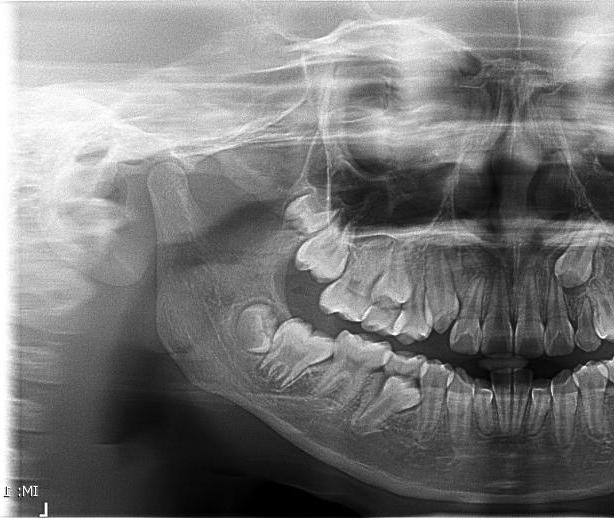

In [61]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

image = cv2.imread(data['Path_Name'][0])
cv2_imshow(image)

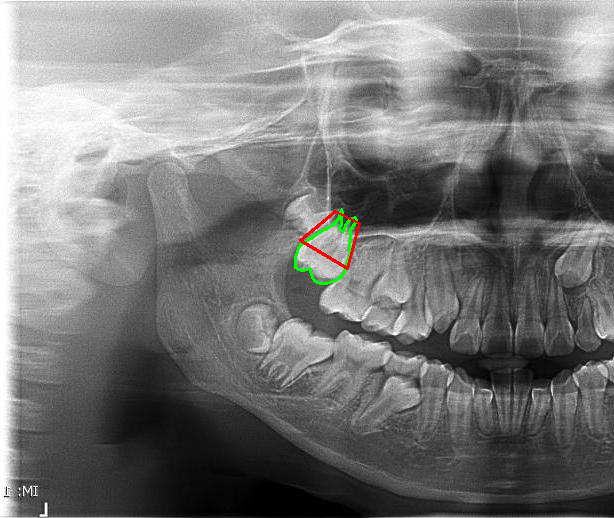

In [55]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# โหลดภาพต้นฉบับ
image = cv2.imread(data['Path_Name'][0])
segmentation_tooth = data['segmentation'][0][0]  # Segmentation ของฟันเดิม
segmentation_bone = data['segmentation'][1][0]  # Segmentation ของจุดอื่น

# แปลง Segmentation ของฟันเดิมเป็น Array ของจุด
points_tooth = np.array(segmentation_tooth, dtype=np.int32).reshape(-1, 2)

# แปลง Segmentation ของจุดอื่นเป็น Array ของจุด
points_bone = np.array(segmentation_bone, dtype=np.int32).reshape(-1, 2)


image_with_polygon = image.copy()

# วาด Polygon แสดงตำแหน่งจุดอื่นบนภาพ
cv2.polylines(image_with_polygon, [points_bone], isClosed=True, color=(0, 255, 0), thickness=2)
# วาด Polygon แสดงตำแหน่งฟันเดิมบนภาพ
cv2.polylines(image_with_polygon, [points_tooth], isClosed=True, color=(0, 0, 255), thickness=2)



# แสดงผลภาพที่มี Polygon ของฟันเดิมและจุดอื่น
cv2_imshow(image_with_polygon)

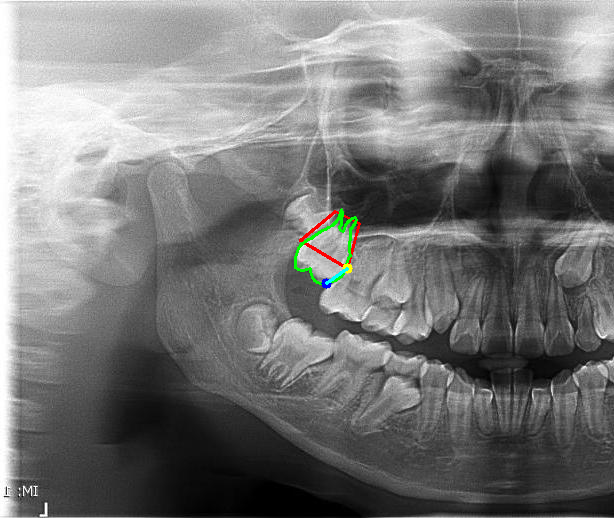

Distance between lowest point of tooth and lowest point of bone: 15 pixels


In [58]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# โหลดภาพต้นฉบับ
image = cv2.imread(data['Path_Name'][0])

# ดึง Segmentation ของฟันและกระดูก   segmentation_bone
segmentation_bone = data['segmentation'][0][0]
segmentation_tooth = data['segmentation'][1][0]

# แปลง Segmentation เป็น Array ของจุด
points_tooth = np.array(segmentation_tooth, dtype=np.int32).reshape(-1, 2)
points_bone = np.array(segmentation_bone, dtype=np.int32).reshape(-1, 2)

# คำนวณจุดต่ำสุดของฟัน (สีน้ำเงิน) → จุดที่มีค่า y มากที่สุด
bottom_tooth = points_tooth[np.argmax(points_tooth[:, 1])]

# คำนวณจุดต่ำสุดของกระดูก (สีเหลือง) → จุดที่มีค่า y มากที่สุด
bottom_bone = points_bone[np.argmax(points_bone[:, 1])]

# คำนวณระยะห่างระหว่างจุดต่ำสุดของฟันกับจุดต่ำสุดของกระดูก
distance = bottom_tooth[1] - bottom_bone[1]

# คัดลอกภาพเพื่อวาดเส้นและจุด
image_with_annotation = image.copy()

# วาด Polygon แสดงตำแหน่งของกระดูก (สีเขียว)
cv2.polylines(image_with_annotation, [points_bone], isClosed=True, color=(0, 0, 255), thickness=2)
# วาด Polygon แสดงตำแหน่งของฟัน (สีแดง)
cv2.polylines(image_with_annotation, [points_tooth], isClosed=True, color=(0, 255, 0), thickness=2)

# วาดจุดที่ใช้คำนวณระยะห่าง
cv2.circle(image_with_annotation, tuple(bottom_tooth), 5, (255, 0, 0), -1)  # จุดต่ำสุดของฟัน (สีน้ำเงิน)
cv2.circle(image_with_annotation, tuple(bottom_bone), 5, (0, 255, 255), -1)  # จุดต่ำสุดของกระดูก (สีเหลือง)

# วาดเส้นแสดงระยะห่าง
cv2.line(image_with_annotation, tuple(bottom_tooth), tuple(bottom_bone), (255, 255, 0), 2)  # เส้นเชื่อม (สีฟ้า)

# แสดงภาพที่มีการใส่ Annotation
cv2_imshow(image_with_annotation)

# แสดงค่าระยะห่าง
print(f"Distance between lowest point of tooth and lowest point of bone: {distance} pixels")

In [59]:
import cv2
import numpy as np
import pandas as pd
from google.colab.patches import cv2_imshow

# สร้างคอลัมน์ใหม่ใน DataFrame เพื่อเก็บผลลัพธ์
data["bottom_tooth_x"] = np.nan
data["bottom_tooth_y"] = np.nan
data["bottom_bone_x"] = np.nan
data["bottom_bone_y"] = np.nan
data["distance_to_bone"] = np.nan

# วนลูปทุกภาพในตาราง data
for idx in range(len(data)):
    try:
        # โหลดภาพต้นฉบับ
        image = cv2.imread(data['Path_Name'][idx])
        if image is None:
            print(f"Warning: Unable to load image at {data['Path_Name'][idx]}")
            continue  # ข้ามถ้าโหลดภาพไม่ได้

        # ดึง Segmentation ของฟันและกระดูก
        segmentation_bone = data['segmentation'][idx][0]  # กระดูก
        segmentation_tooth = data['segmentation'][idx][1]  # ฟัน

        # แปลง Segmentation เป็น Array ของจุด
        points_tooth = np.array(segmentation_tooth, dtype=np.int32).reshape(-1, 2)
        points_bone = np.array(segmentation_bone, dtype=np.int32).reshape(-1, 2)

        # คำนวณจุดต่ำสุดของฟัน (สีน้ำเงิน) → จุดที่มีค่า y มากที่สุด
        bottom_tooth = points_tooth[np.argmax(points_tooth[:, 1])]

        # คำนวณจุดต่ำสุดของกระดูก (สีเหลือง) → จุดที่มีค่า y มากที่สุด
        bottom_bone = points_bone[np.argmax(points_bone[:, 1])]

        # คำนวณระยะห่างระหว่างจุดต่ำสุดของฟันกับจุดต่ำสุดของกระดูก
        distance = bottom_tooth[1] - bottom_bone[1]

        # เก็บค่าพิกัดและระยะห่างลงในตาราง data
        data.at[idx, "bottom_tooth_x"] = bottom_tooth[0]
        data.at[idx, "bottom_tooth_y"] = bottom_tooth[1]
        data.at[idx, "bottom_bone_x"] = bottom_bone[0]
        data.at[idx, "bottom_bone_y"] = bottom_bone[1]
        data.at[idx, "distance_to_bone"] = distance

        # คัดลอกภาพเพื่อวาดเส้นและจุด
        image_with_annotation = image.copy()

        # วาด Polygon แสดงตำแหน่งของกระดูก (สีเขียว)
        cv2.polylines(image_with_annotation, [points_bone], isClosed=True, color=(0, 0, 255), thickness=2)
        # วาด Polygon แสดงตำแหน่งของฟัน (สีแดง)
        cv2.polylines(image_with_annotation, [points_tooth], isClosed=True, color=(0, 255, 0), thickness=2)

        # วาดจุดที่ใช้คำนวณระยะห่าง
        cv2.circle(image_with_annotation, tuple(bottom_tooth), 5, (255, 0, 0), -1)  # จุดต่ำสุดของฟัน (สีน้ำเงิน)
        cv2.circle(image_with_annotation, tuple(bottom_bone), 5, (0, 255, 255), -1)  # จุดต่ำสุดของกระดูก (สีเหลือง)

        # วาดเส้นแสดงระยะห่าง
        cv2.line(image_with_annotation, tuple(bottom_tooth), tuple(bottom_bone), (255, 255, 0), 2)  # เส้นเชื่อม (สีฟ้า)

        # แสดงภาพที่มีการใส่ Annotation (เฉพาะบางภาพเพื่อไม่ให้โหลดช้า)
        if idx % 10 == 0:  # แสดงภาพทุก 10 ภาพ
            cv2_imshow(image_with_annotation)

        print(f"Processed image {idx+1}/{len(data)}: Distance = {distance} pixels")

    except Exception as e:
        print(f"Error processing image {idx}: {e}")

# # บันทึกตารางผลลัพธ์ลงไฟล์ CSV
# data.to_csv("updated_data_with_distance.csv", index=False)


Error processing image 0: list index out of range
Error processing image 1: list index out of range
Error processing image 2: list index out of range
Error processing image 3: list index out of range
Error processing image 4: list index out of range
Error processing image 5: list index out of range
Error processing image 6: list index out of range
Error processing image 7: list index out of range
Error processing image 8: list index out of range
Error processing image 9: list index out of range
Error processing image 10: list index out of range
Error processing image 11: list index out of range
Error processing image 12: list index out of range
Error processing image 13: list index out of range
Error processing image 14: list index out of range
Error processing image 15: list index out of range
Error processing image 16: list index out of range
Error processing image 17: list index out of range
Error processing image 18: list index out of range
Error processing image 19: list index out

KeyboardInterrupt: 

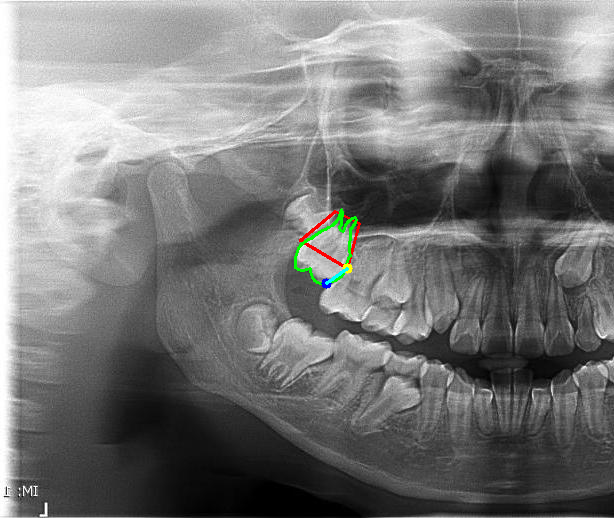

Processed image 1/369: Distance = 15 pixels
Processed image 2/369: Distance = -10 pixels
Processed image 3/369: Distance = 14 pixels
Processed image 4/369: Distance = -6 pixels
Processed image 5/369: Distance = -10 pixels
Processed image 6/369: Distance = -4 pixels
Processed image 7/369: Distance = -11 pixels
Processed image 8/369: Distance = -12 pixels
Processed image 9/369: Distance = -8 pixels
Processed image 10/369: Distance = -15 pixels


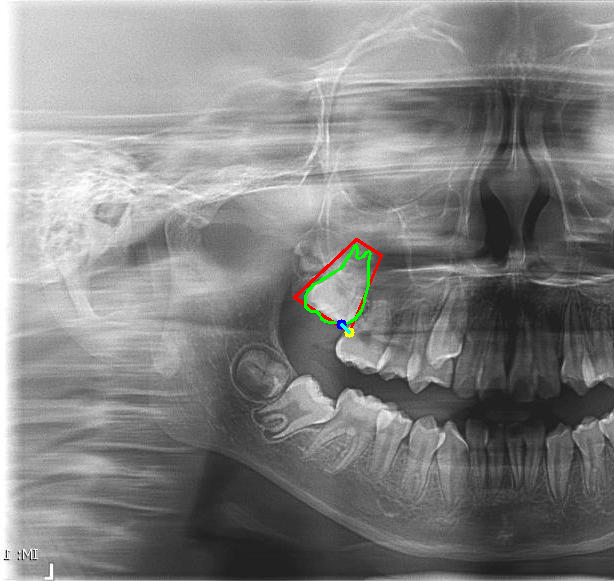

Processed image 11/369: Distance = -8 pixels
Processed image 12/369: Distance = -9 pixels
Processed image 13/369: Distance = -9 pixels
Processed image 14/369: Distance = -8 pixels
Processed image 15/369: Distance = -15 pixels
Processed image 16/369: Distance = -8 pixels
Processed image 17/369: Distance = -13 pixels
Processed image 18/369: Distance = -11 pixels
Processed image 19/369: Distance = -10 pixels
Processed image 20/369: Distance = -2 pixels


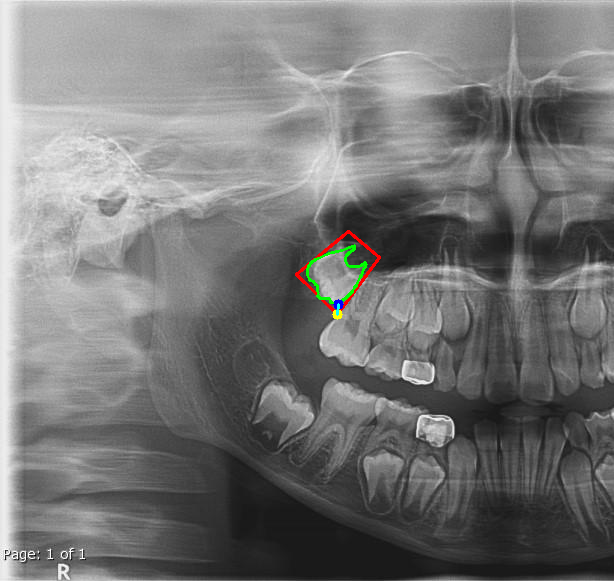

Processed image 21/369: Distance = -10 pixels
Processed image 22/369: Distance = -13 pixels
Processed image 23/369: Distance = -12 pixels
Processed image 24/369: Distance = -11 pixels
Processed image 25/369: Distance = -10 pixels
Processed image 26/369: Distance = -5 pixels
Processed image 27/369: Distance = -16 pixels
Processed image 28/369: Distance = -13 pixels
Processed image 29/369: Distance = -7 pixels
Processed image 30/369: Distance = -6 pixels


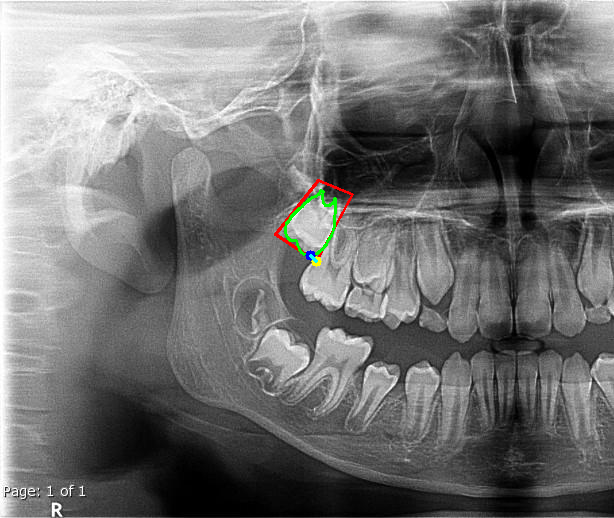

Processed image 31/369: Distance = -6 pixels
Processed image 32/369: Distance = -14 pixels
Processed image 33/369: Distance = -9 pixels
Processed image 34/369: Distance = 8 pixels
Processed image 35/369: Distance = -4 pixels
Processed image 36/369: Distance = -9 pixels
Processed image 37/369: Distance = 3 pixels
Processed image 38/369: Distance = 8 pixels
Processed image 39/369: Distance = 7 pixels
Processed image 40/369: Distance = 8 pixels


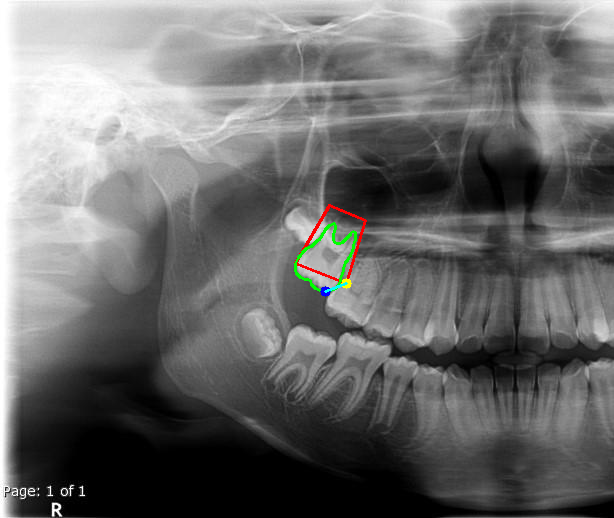

Processed image 41/369: Distance = 8 pixels
Processed image 42/369: Distance = -19 pixels
Processed image 43/369: Distance = 21 pixels
Processed image 44/369: Distance = -4 pixels
Processed image 45/369: Distance = -9 pixels
Processed image 46/369: Distance = -3 pixels
Processed image 47/369: Distance = 12 pixels
Processed image 48/369: Distance = 5 pixels
Processed image 49/369: Distance = -4 pixels
Processed image 50/369: Distance = -2 pixels


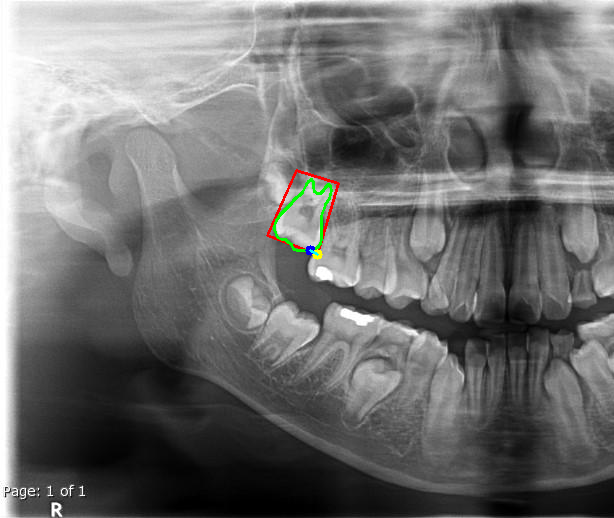

Processed image 51/369: Distance = -4 pixels
Processed image 52/369: Distance = 20 pixels
Processed image 53/369: Distance = 5 pixels
Processed image 54/369: Distance = -3 pixels
Processed image 55/369: Distance = 2 pixels
Processed image 56/369: Distance = -11 pixels
Processed image 57/369: Distance = -6 pixels
Processed image 58/369: Distance = -12 pixels
Processed image 59/369: Distance = 1 pixels
Processed image 60/369: Distance = -7 pixels


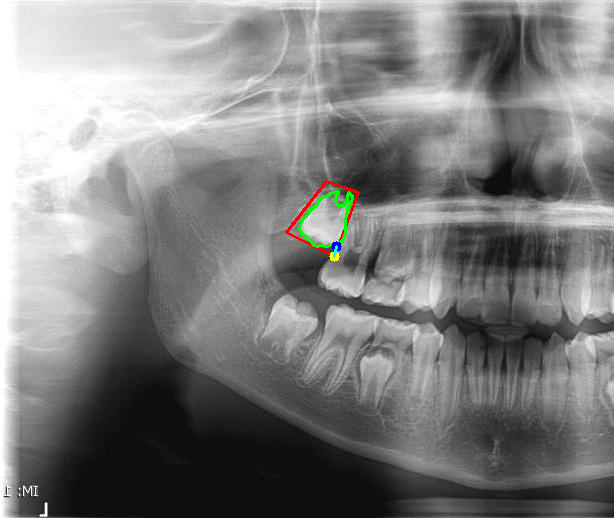

Processed image 61/369: Distance = -10 pixels
Processed image 62/369: Distance = 2 pixels
Processed image 63/369: Distance = 6 pixels
Processed image 64/369: Distance = 21 pixels
Processed image 65/369: Distance = -3 pixels
Processed image 66/369: Distance = 15 pixels
Processed image 67/369: Distance = -8 pixels
Processed image 68/369: Distance = -5 pixels
Processed image 69/369: Distance = 3 pixels
Processed image 70/369: Distance = 16 pixels


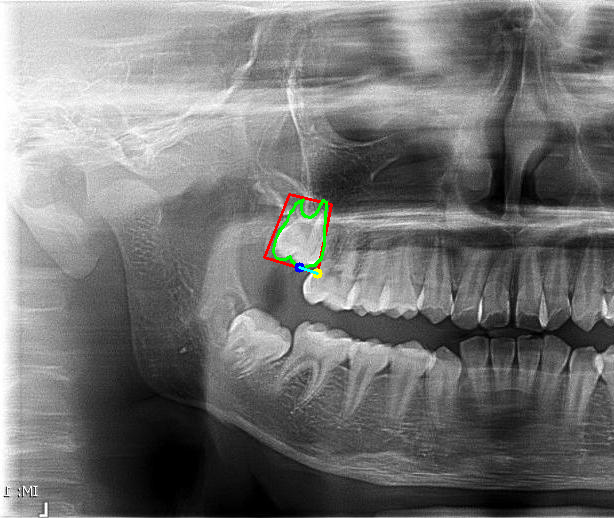

Processed image 71/369: Distance = -6 pixels
Processed image 72/369: Distance = -1 pixels
Processed image 73/369: Distance = 2 pixels
Processed image 74/369: Distance = 13 pixels
Processed image 75/369: Distance = 2 pixels
Processed image 76/369: Distance = -6 pixels
Processed image 77/369: Distance = 23 pixels
Processed image 78/369: Distance = 11 pixels
Processed image 79/369: Distance = 2 pixels
Processed image 80/369: Distance = 19 pixels


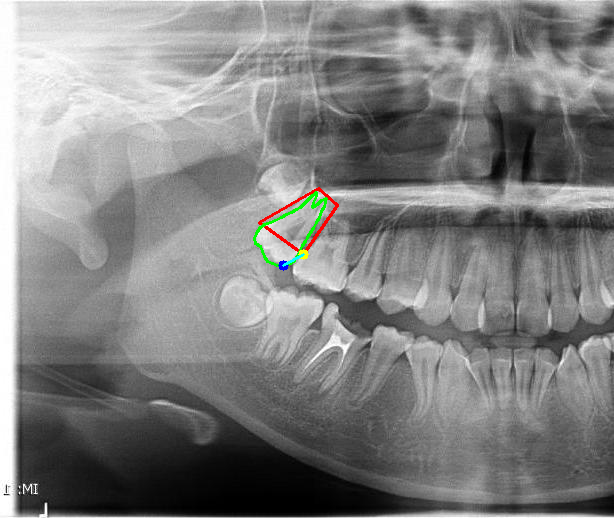

Processed image 81/369: Distance = 11 pixels
Processed image 82/369: Distance = 21 pixels
Processed image 83/369: Distance = 20 pixels
Processed image 84/369: Distance = 21 pixels
Processed image 85/369: Distance = -9 pixels
Processed image 86/369: Distance = 12 pixels
Processed image 87/369: Distance = 14 pixels
Processed image 88/369: Distance = 23 pixels
Processed image 89/369: Distance = 14 pixels
Processed image 90/369: Distance = 27 pixels


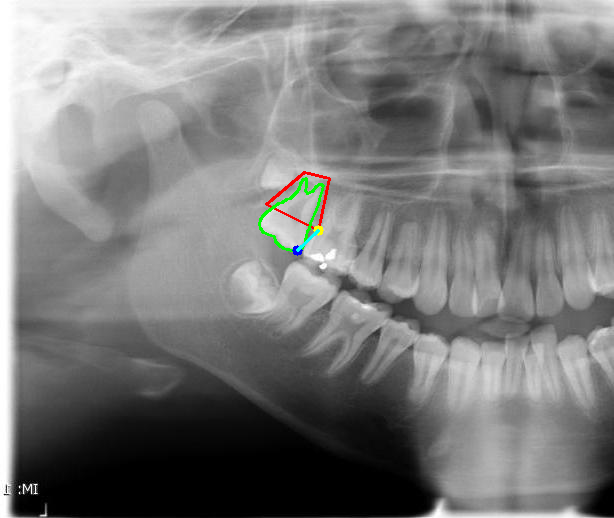

Processed image 91/369: Distance = 20 pixels
Processed image 92/369: Distance = 19 pixels
Processed image 93/369: Distance = 11 pixels
Processed image 94/369: Distance = 4 pixels
Processed image 95/369: Distance = 13 pixels
Processed image 96/369: Distance = -5 pixels
Processed image 97/369: Distance = 23 pixels
Processed image 98/369: Distance = 12 pixels
Processed image 99/369: Distance = 23 pixels
Processed image 100/369: Distance = 23 pixels


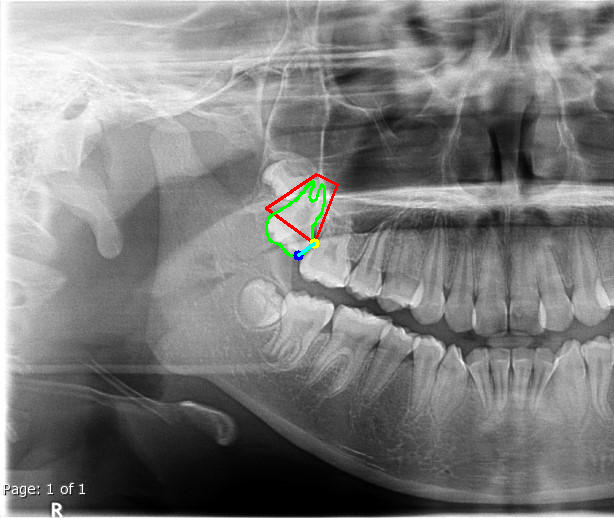

Processed image 101/369: Distance = 12 pixels
Processed image 102/369: Distance = 25 pixels
Processed image 103/369: Distance = -8 pixels
Processed image 104/369: Distance = 14 pixels
Processed image 105/369: Distance = 19 pixels
Processed image 106/369: Distance = 13 pixels
Processed image 107/369: Distance = 26 pixels
Processed image 108/369: Distance = 19 pixels
Processed image 109/369: Distance = 17 pixels
Processed image 110/369: Distance = -5 pixels


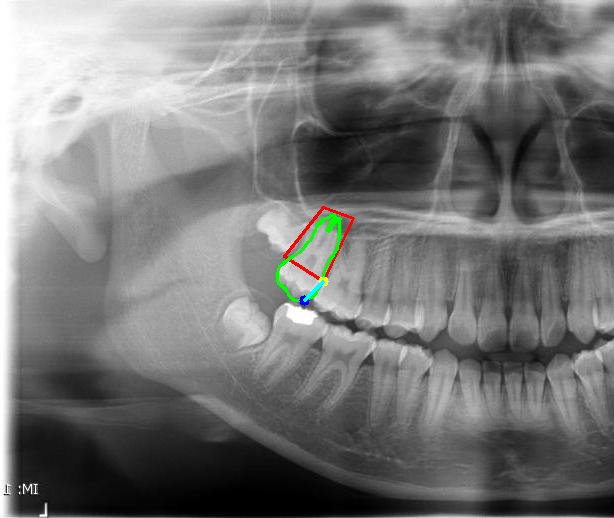

Processed image 111/369: Distance = 19 pixels
Processed image 112/369: Distance = 14 pixels
Processed image 113/369: Distance = 17 pixels
Processed image 114/369: Distance = 19 pixels
Processed image 115/369: Distance = 23 pixels
Processed image 116/369: Distance = 11 pixels
Processed image 117/369: Distance = 18 pixels
Processed image 118/369: Distance = 19 pixels
Processed image 119/369: Distance = 18 pixels
Processed image 120/369: Distance = -7 pixels


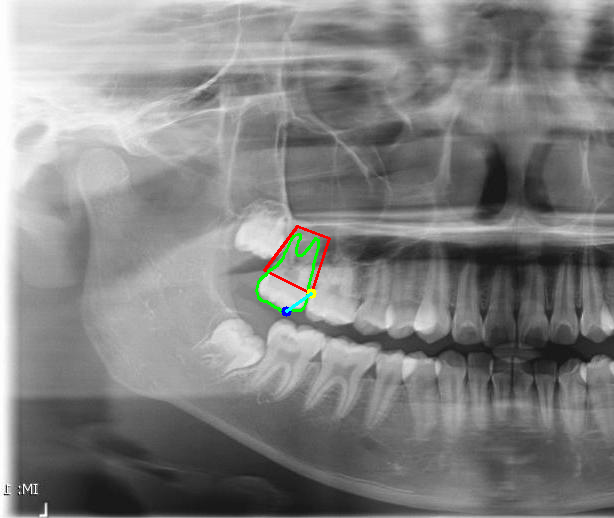

Processed image 121/369: Distance = 18 pixels
Processed image 122/369: Distance = -6 pixels
Processed image 123/369: Distance = 29 pixels
Processed image 124/369: Distance = 25 pixels
Processed image 125/369: Distance = 19 pixels
Processed image 126/369: Distance = 18 pixels
Processed image 127/369: Distance = 23 pixels
Processed image 128/369: Distance = 19 pixels
Processed image 129/369: Distance = 20 pixels
Processed image 130/369: Distance = 17 pixels


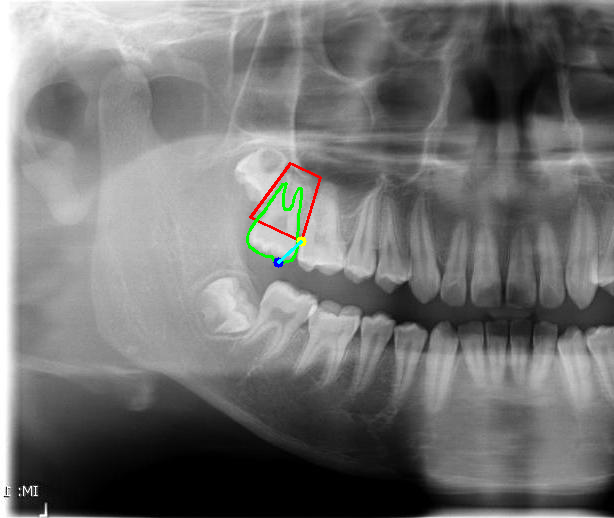

Processed image 131/369: Distance = 21 pixels
Processed image 132/369: Distance = 26 pixels
Processed image 133/369: Distance = 20 pixels
Processed image 134/369: Distance = 16 pixels
Processed image 135/369: Distance = -6 pixels
Processed image 136/369: Distance = 12 pixels
Processed image 137/369: Distance = 24 pixels
Processed image 138/369: Distance = 21 pixels
Processed image 139/369: Distance = 13 pixels
Processed image 140/369: Distance = 19 pixels


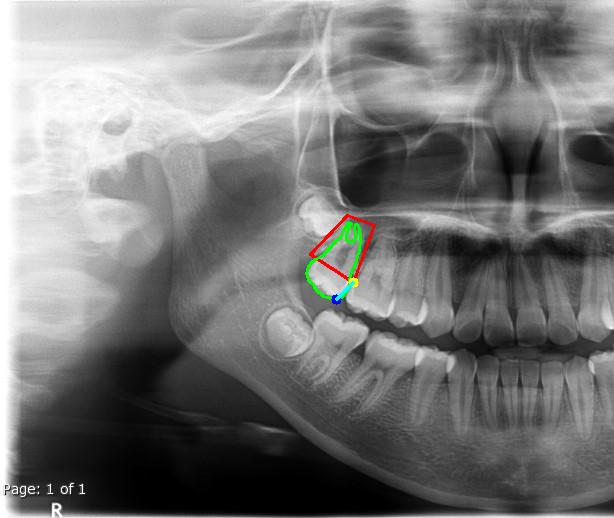

Processed image 141/369: Distance = 17 pixels
Processed image 142/369: Distance = 21 pixels
Processed image 143/369: Distance = -13 pixels
Processed image 144/369: Distance = 14 pixels
Processed image 145/369: Distance = 23 pixels
Processed image 146/369: Distance = 15 pixels
Processed image 147/369: Distance = 22 pixels
Processed image 148/369: Distance = 19 pixels
Processed image 149/369: Distance = 21 pixels
Processed image 150/369: Distance = 27 pixels


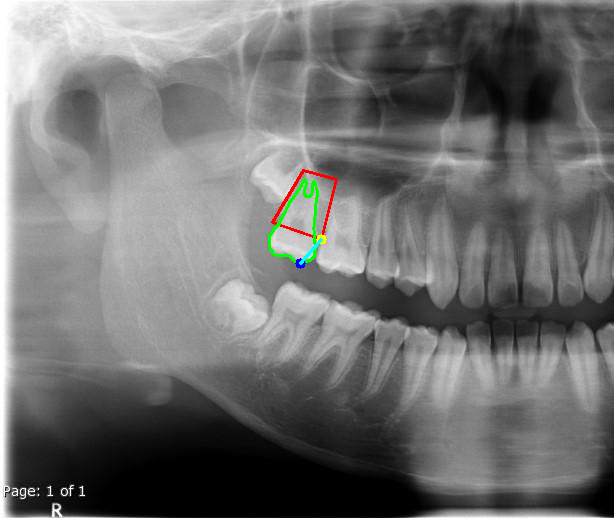

Processed image 151/369: Distance = 24 pixels
Processed image 152/369: Distance = 25 pixels
Processed image 153/369: Distance = 18 pixels
Processed image 154/369: Distance = 18 pixels
Processed image 155/369: Distance = 22 pixels
Processed image 156/369: Distance = 22 pixels
Processed image 157/369: Distance = 18 pixels
Processed image 158/369: Distance = 23 pixels
Processed image 159/369: Distance = 15 pixels
Processed image 160/369: Distance = 18 pixels


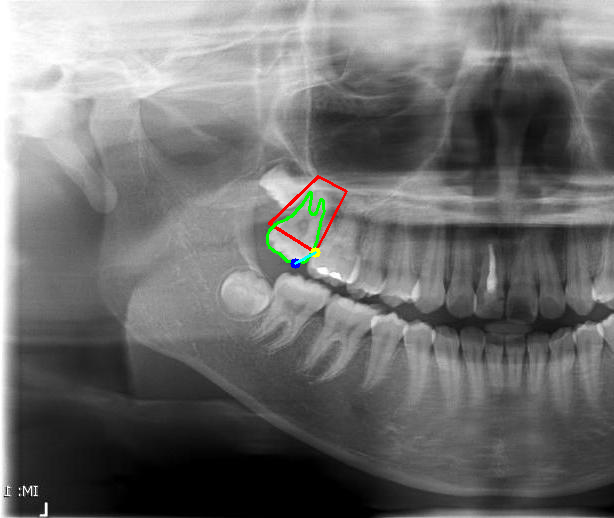

Processed image 161/369: Distance = 11 pixels
Processed image 162/369: Distance = 23 pixels
Processed image 163/369: Distance = 22 pixels
Processed image 164/369: Distance = 25 pixels
Processed image 165/369: Distance = 20 pixels
Processed image 166/369: Distance = 11 pixels
Processed image 167/369: Distance = 17 pixels
Processed image 168/369: Distance = 28 pixels
Processed image 169/369: Distance = 19 pixels
Processed image 170/369: Distance = 17 pixels


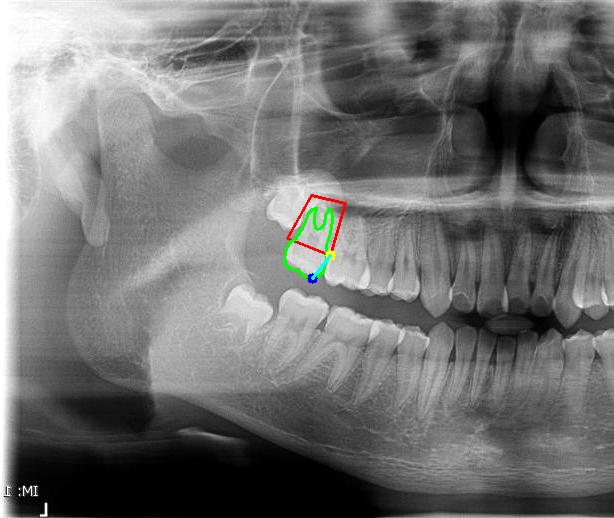

Processed image 171/369: Distance = 23 pixels
Processed image 172/369: Distance = 20 pixels
Processed image 173/369: Distance = 24 pixels
Processed image 174/369: Distance = 24 pixels
Processed image 175/369: Distance = 17 pixels
Processed image 176/369: Distance = 24 pixels
Processed image 177/369: Distance = 25 pixels
Processed image 178/369: Distance = 19 pixels
Processed image 179/369: Distance = 12 pixels
Processed image 180/369: Distance = 22 pixels


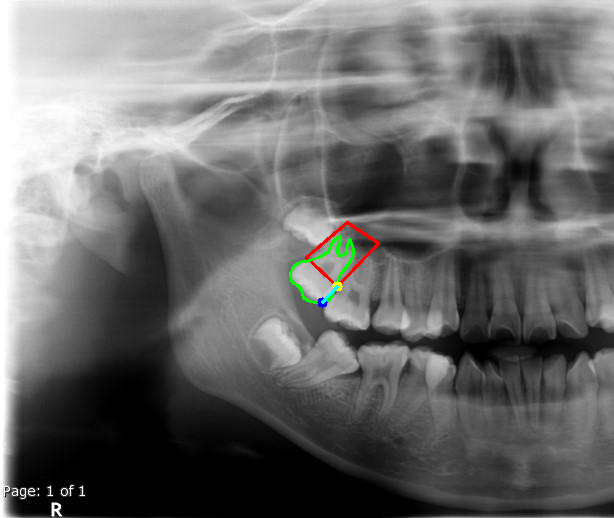

Processed image 181/369: Distance = 16 pixels
Processed image 182/369: Distance = 23 pixels
Processed image 183/369: Distance = 18 pixels
Processed image 184/369: Distance = 23 pixels
Processed image 185/369: Distance = 25 pixels
Processed image 186/369: Distance = 21 pixels
Processed image 187/369: Distance = 17 pixels
Processed image 188/369: Distance = 17 pixels
Processed image 189/369: Distance = 15 pixels
Processed image 190/369: Distance = 14 pixels


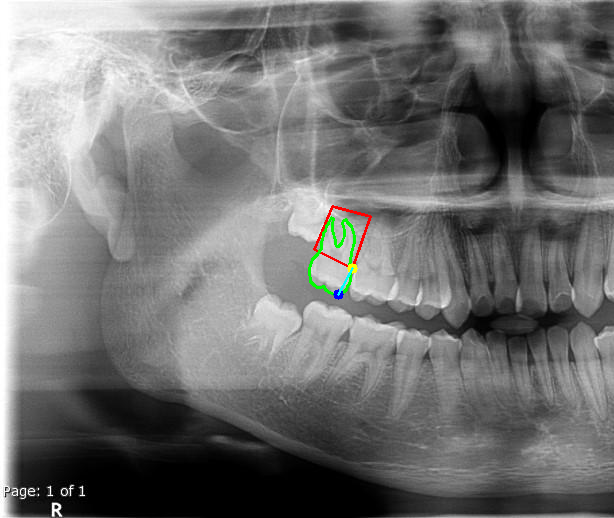

Processed image 191/369: Distance = 26 pixels
Processed image 192/369: Distance = 19 pixels
Processed image 193/369: Distance = 22 pixels
Processed image 194/369: Distance = 22 pixels
Processed image 195/369: Distance = 21 pixels
Processed image 196/369: Distance = 21 pixels
Processed image 197/369: Distance = -10 pixels
Processed image 198/369: Distance = 19 pixels
Processed image 199/369: Distance = 27 pixels
Processed image 200/369: Distance = 24 pixels


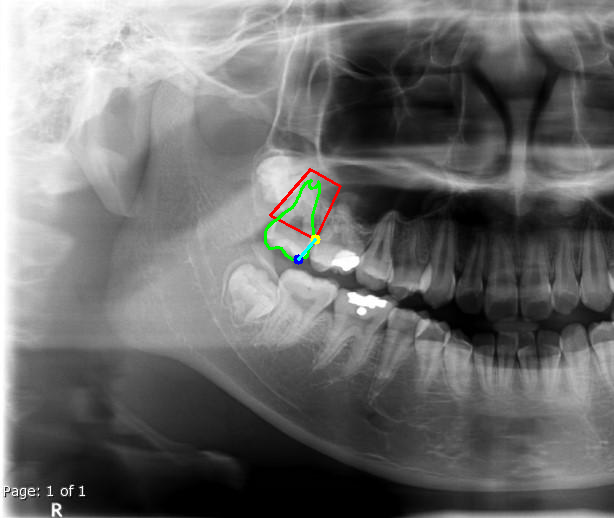

Processed image 201/369: Distance = 20 pixels
Processed image 202/369: Distance = 18 pixels
Processed image 203/369: Distance = 29 pixels
Processed image 204/369: Distance = 21 pixels
Processed image 205/369: Distance = 20 pixels
Processed image 206/369: Distance = 23 pixels
Processed image 207/369: Distance = 24 pixels
Processed image 208/369: Distance = 29 pixels
Processed image 209/369: Distance = 24 pixels
Processed image 210/369: Distance = 34 pixels


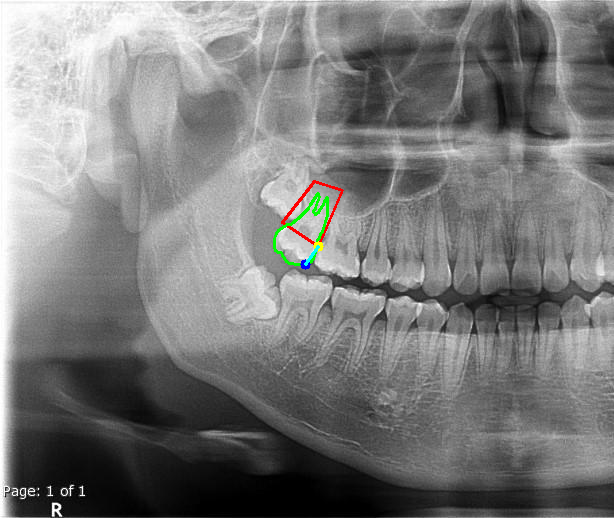

Processed image 211/369: Distance = 18 pixels
Processed image 212/369: Distance = 26 pixels
Processed image 213/369: Distance = 26 pixels
Processed image 214/369: Distance = 17 pixels
Processed image 215/369: Distance = 17 pixels
Processed image 216/369: Distance = 19 pixels
Processed image 217/369: Distance = 15 pixels
Processed image 218/369: Distance = 15 pixels
Processed image 219/369: Distance = 24 pixels
Processed image 220/369: Distance = 20 pixels


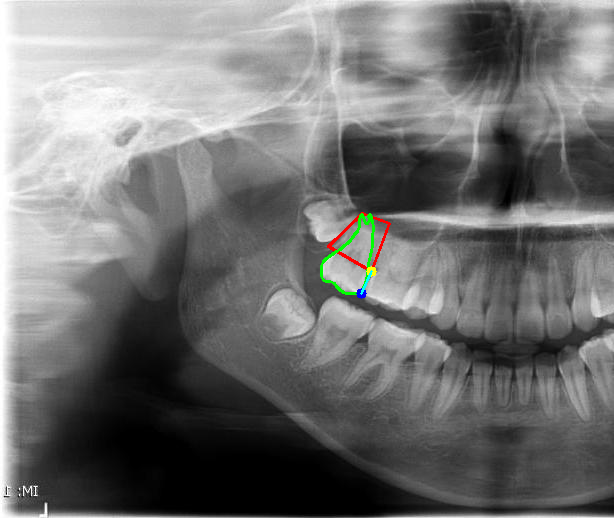

Processed image 221/369: Distance = 22 pixels
Processed image 222/369: Distance = 26 pixels
Processed image 223/369: Distance = 27 pixels
Processed image 224/369: Distance = 21 pixels
Processed image 225/369: Distance = 20 pixels
Processed image 226/369: Distance = 15 pixels
Processed image 227/369: Distance = 23 pixels
Processed image 228/369: Distance = 21 pixels
Processed image 229/369: Distance = 17 pixels
Processed image 230/369: Distance = 24 pixels


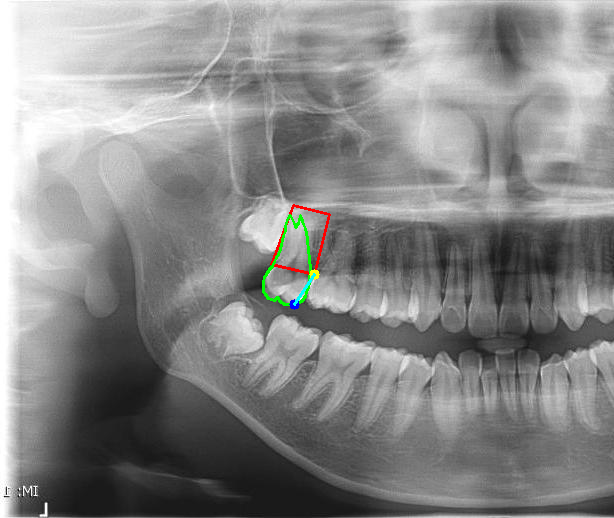

Processed image 231/369: Distance = 30 pixels
Processed image 232/369: Distance = 24 pixels
Processed image 233/369: Distance = 21 pixels
Processed image 234/369: Distance = 26 pixels
Processed image 235/369: Distance = 23 pixels
Processed image 236/369: Distance = 23 pixels
Processed image 237/369: Distance = 25 pixels
Processed image 238/369: Distance = 18 pixels
Processed image 239/369: Distance = 17 pixels
Processed image 240/369: Distance = 21 pixels


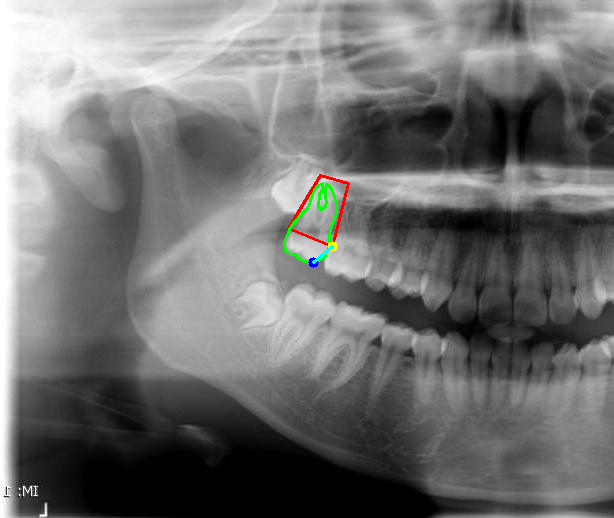

Processed image 241/369: Distance = 16 pixels
Processed image 242/369: Distance = 21 pixels
Processed image 243/369: Distance = 23 pixels
Processed image 244/369: Distance = 24 pixels
Processed image 245/369: Distance = 28 pixels
Processed image 246/369: Distance = 13 pixels
Processed image 247/369: Distance = 17 pixels
Processed image 248/369: Distance = 20 pixels
Processed image 249/369: Distance = 19 pixels
Processed image 250/369: Distance = 23 pixels


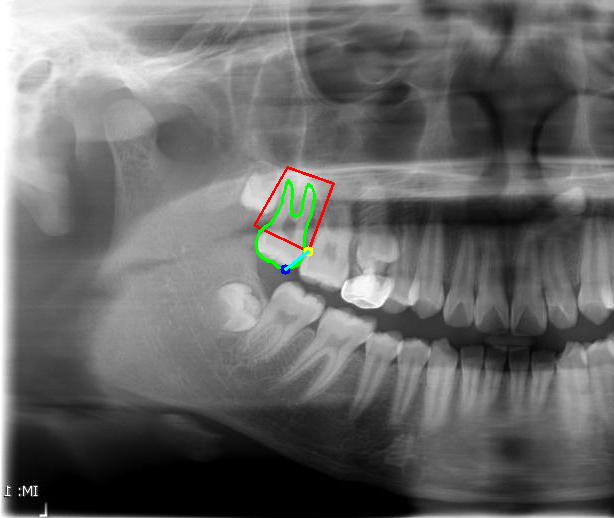

Processed image 251/369: Distance = 18 pixels
Processed image 252/369: Distance = 21 pixels
Processed image 253/369: Distance = 31 pixels
Processed image 254/369: Distance = 26 pixels
Processed image 255/369: Distance = 21 pixels
Processed image 256/369: Distance = 26 pixels
Processed image 257/369: Distance = 22 pixels
Processed image 258/369: Distance = 26 pixels
Processed image 259/369: Distance = 22 pixels
Processed image 260/369: Distance = 27 pixels


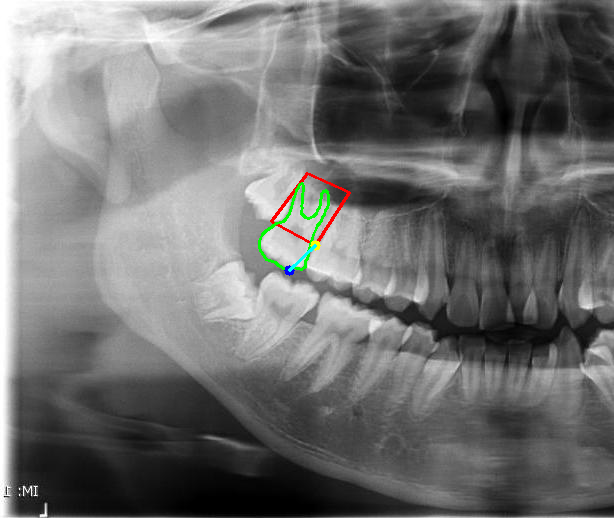

Processed image 261/369: Distance = 25 pixels
Processed image 262/369: Distance = 26 pixels
Processed image 263/369: Distance = 19 pixels
Processed image 264/369: Distance = 25 pixels
Processed image 265/369: Distance = 24 pixels
Processed image 266/369: Distance = 22 pixels
Processed image 267/369: Distance = 23 pixels
Processed image 268/369: Distance = 26 pixels
Processed image 269/369: Distance = 23 pixels
Processed image 270/369: Distance = 22 pixels


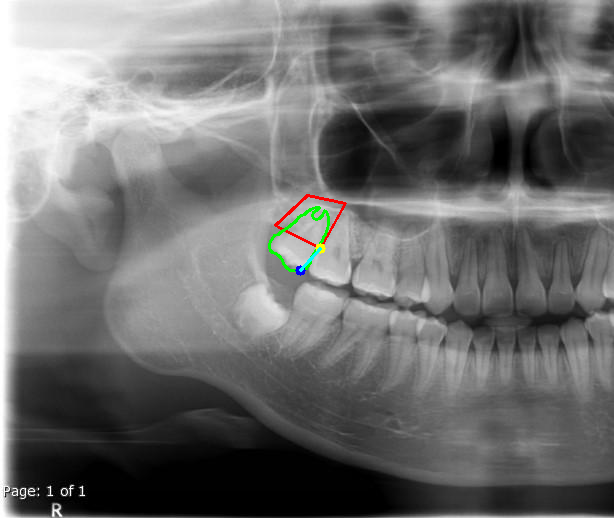

Processed image 271/369: Distance = 22 pixels
Processed image 272/369: Distance = 21 pixels
Processed image 273/369: Distance = 25 pixels
Processed image 274/369: Distance = 28 pixels
Processed image 275/369: Distance = 25 pixels
Processed image 276/369: Distance = 20 pixels
Processed image 277/369: Distance = 21 pixels
Processed image 278/369: Distance = 26 pixels
Processed image 279/369: Distance = 24 pixels
Processed image 280/369: Distance = 22 pixels


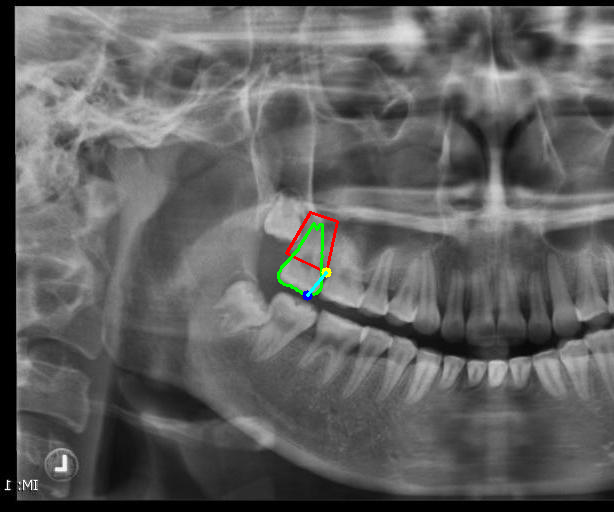

Processed image 281/369: Distance = 23 pixels
Processed image 282/369: Distance = 27 pixels
Processed image 283/369: Distance = 21 pixels
Processed image 284/369: Distance = 20 pixels
Processed image 285/369: Distance = 20 pixels
Processed image 286/369: Distance = 24 pixels
Processed image 287/369: Distance = 20 pixels
Processed image 288/369: Distance = 26 pixels
Processed image 289/369: Distance = 17 pixels
Processed image 290/369: Distance = 27 pixels


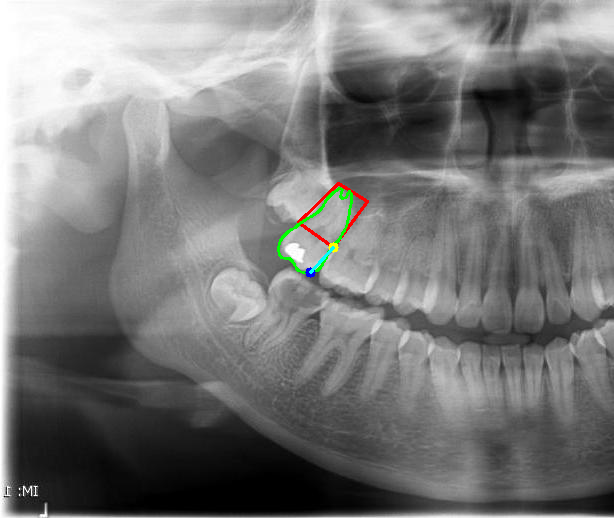

Processed image 291/369: Distance = 25 pixels
Processed image 292/369: Distance = 21 pixels
Processed image 293/369: Distance = 35 pixels
Processed image 294/369: Distance = 23 pixels
Processed image 295/369: Distance = 21 pixels
Processed image 296/369: Distance = 36 pixels
Processed image 297/369: Distance = 28 pixels
Processed image 298/369: Distance = 25 pixels
Processed image 299/369: Distance = 27 pixels
Processed image 300/369: Distance = 25 pixels


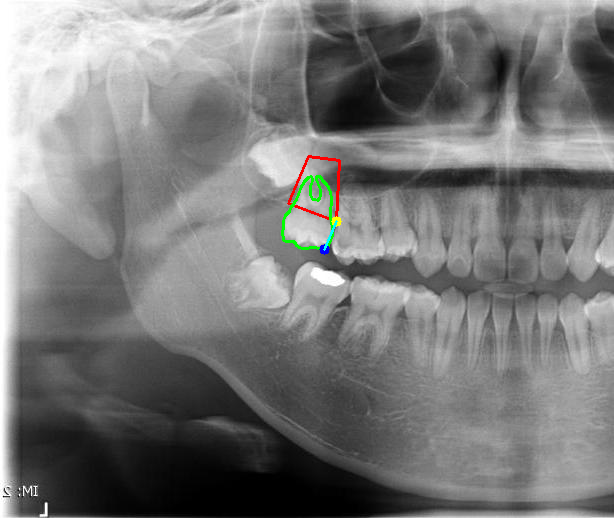

Processed image 301/369: Distance = 28 pixels
Processed image 302/369: Distance = 21 pixels
Processed image 303/369: Distance = 21 pixels
Processed image 304/369: Distance = 21 pixels
Processed image 305/369: Distance = 23 pixels
Processed image 306/369: Distance = 21 pixels
Processed image 307/369: Distance = 23 pixels
Processed image 308/369: Distance = 21 pixels
Processed image 309/369: Distance = 25 pixels
Processed image 310/369: Distance = 22 pixels


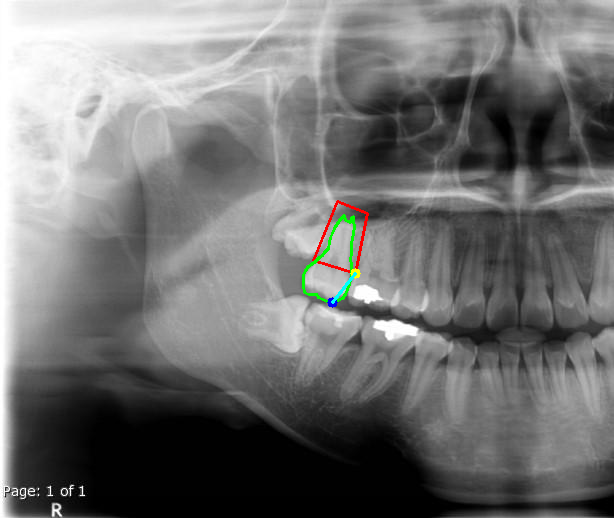

Processed image 311/369: Distance = 29 pixels
Processed image 312/369: Distance = 20 pixels
Processed image 313/369: Distance = 21 pixels
Processed image 314/369: Distance = 27 pixels
Processed image 315/369: Distance = 27 pixels
Processed image 316/369: Distance = 26 pixels
Processed image 317/369: Distance = 26 pixels
Processed image 318/369: Distance = 29 pixels
Processed image 319/369: Distance = 21 pixels
Processed image 320/369: Distance = 24 pixels


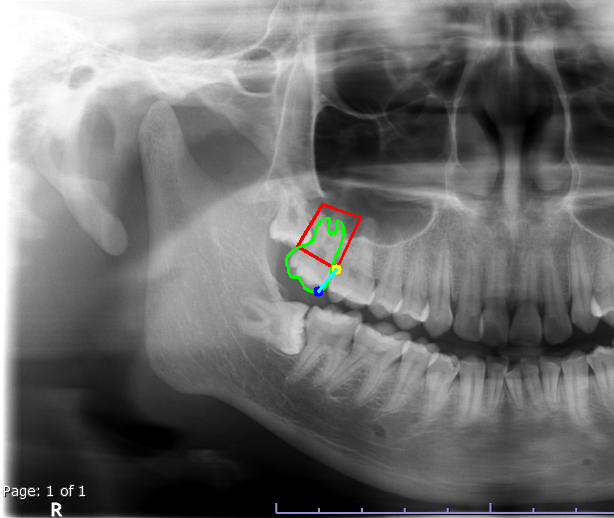

Processed image 321/369: Distance = 22 pixels
Processed image 322/369: Distance = 23 pixels
Processed image 323/369: Distance = 26 pixels
Processed image 324/369: Distance = 19 pixels
Processed image 325/369: Distance = 25 pixels
Processed image 326/369: Distance = 21 pixels
Processed image 327/369: Distance = 25 pixels
Processed image 328/369: Distance = 20 pixels
Processed image 329/369: Distance = 22 pixels
Processed image 330/369: Distance = 24 pixels


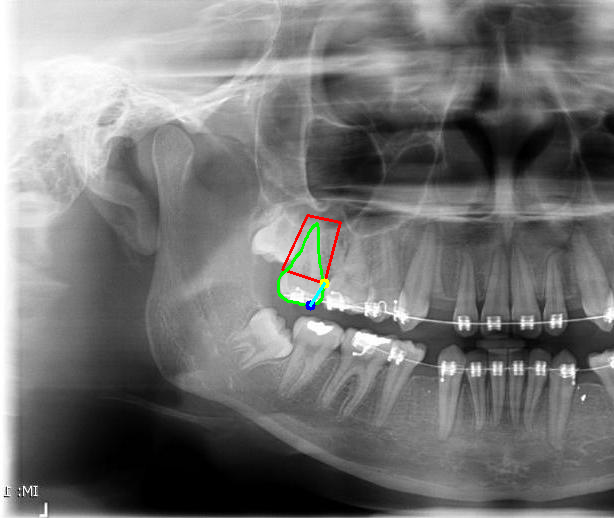

Processed image 331/369: Distance = 22 pixels
Processed image 332/369: Distance = 30 pixels
Processed image 333/369: Distance = 23 pixels
Processed image 334/369: Distance = 21 pixels
Processed image 335/369: Distance = 30 pixels
Processed image 336/369: Distance = 26 pixels
Processed image 337/369: Distance = 27 pixels
Processed image 338/369: Distance = 24 pixels
Processed image 339/369: Distance = 26 pixels
Processed image 340/369: Distance = 23 pixels


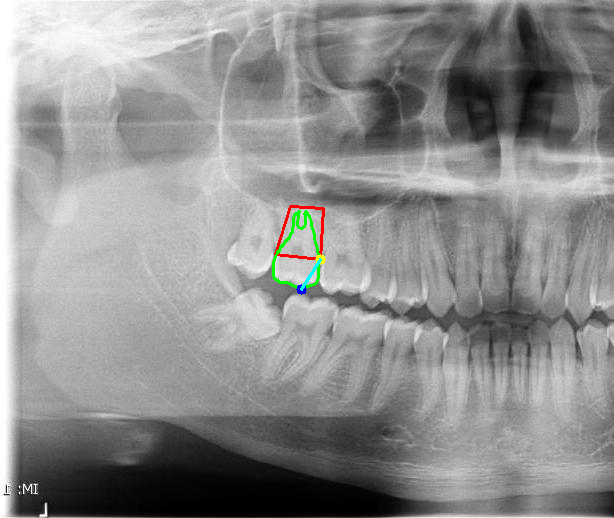

Processed image 341/369: Distance = 30 pixels
Processed image 342/369: Distance = 23 pixels
Processed image 343/369: Distance = 21 pixels
Processed image 344/369: Distance = 29 pixels
Processed image 345/369: Distance = 25 pixels
Processed image 346/369: Distance = 31 pixels
Processed image 347/369: Distance = 27 pixels
Processed image 348/369: Distance = 25 pixels
Processed image 349/369: Distance = 27 pixels
Processed image 350/369: Distance = 22 pixels


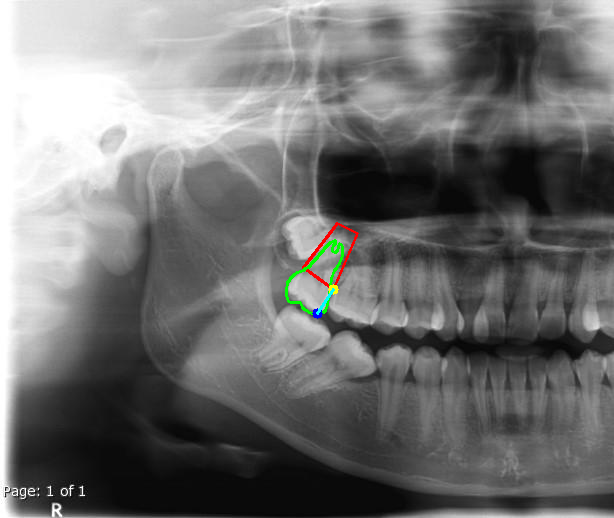

Processed image 351/369: Distance = 24 pixels
Processed image 352/369: Distance = 27 pixels
Processed image 353/369: Distance = 27 pixels
Processed image 354/369: Distance = 20 pixels
Processed image 355/369: Distance = 28 pixels
Processed image 356/369: Distance = 27 pixels
Processed image 357/369: Distance = 21 pixels
Processed image 358/369: Distance = 24 pixels
Processed image 359/369: Distance = 20 pixels
Processed image 360/369: Distance = 28 pixels


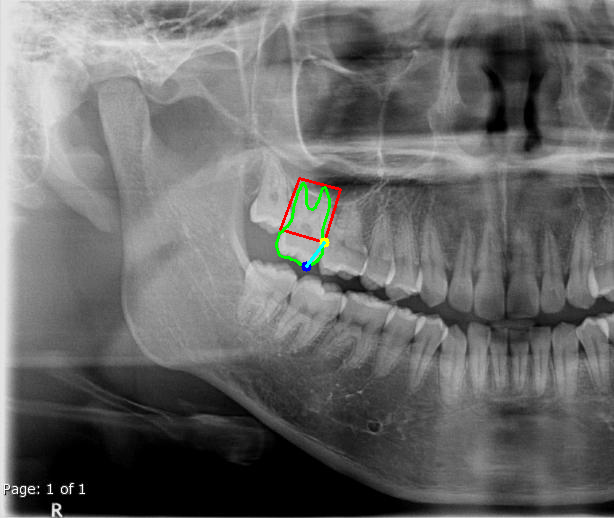

Processed image 361/369: Distance = 24 pixels
Processed image 362/369: Distance = 25 pixels
Processed image 363/369: Distance = 25 pixels
Processed image 364/369: Distance = 24 pixels
Processed image 365/369: Distance = 27 pixels
Processed image 366/369: Distance = 28 pixels
Processed image 367/369: Distance = 25 pixels
Processed image 368/369: Distance = 36 pixels
Processed image 369/369: Distance = 29 pixels


In [60]:
import cv2
import numpy as np
import pandas as pd
from google.colab.patches import cv2_imshow

# ตรวจสอบว่ามีคอลัมน์ที่ต้องใช้หรือไม่ ถ้ายังไม่มีให้เพิ่ม
columns_to_add = ["bottom_tooth_x", "bottom_tooth_y", "bottom_bone_x", "bottom_bone_y", "distance_to_bone"]
for col in columns_to_add:
    if col not in data.columns:
        data[col] = np.nan

# แยกข้อมูลของฟันและกระดูกออกจากกัน
df_tooth = data[data["name"] == "Upper Second Molar"].copy()
df_bone = data[data["name"] == "Alveolar bone"].copy()

# รวมข้อมูลโดยจับคู่กันด้วย `Filename`
df_merged = pd.merge(df_tooth, df_bone, on=["Filename"], suffixes=("_tooth", "_bone"))

# วนลูปทุกภาพที่มีข้อมูลครบ
for idx in range(len(df_merged)):
    try:
        # โหลดภาพต้นฉบับ
        image = cv2.imread(df_merged['Path_Name_tooth'].iloc[idx])
        if image is None:
            print(f"Warning: Unable to load image at {df_merged['Path_Name_tooth'].iloc[idx]}")
            continue  # ข้ามถ้าโหลดภาพไม่ได้

        # ดึง Segmentation ของฟันและกระดูก
        segmentation_tooth = df_merged['segmentation_tooth'].iloc[idx][0]  # ฟัน
        segmentation_bone = df_merged['segmentation_bone'].iloc[idx][0]  # กระดูก

        # แปลง Segmentation เป็น Array ของจุด
        points_tooth = np.array(segmentation_tooth, dtype=np.int32).reshape(-1, 2)
        points_bone = np.array(segmentation_bone, dtype=np.int32).reshape(-1, 2)

        # คำนวณจุดต่ำสุดของฟัน (สีน้ำเงิน) → จุดที่มีค่า y มากที่สุด
        bottom_tooth = points_tooth[np.argmax(points_tooth[:, 1])]

        # คำนวณจุดต่ำสุดของกระดูก (สีเหลือง) → จุดที่มีค่า y มากที่สุด
        bottom_bone = points_bone[np.argmax(points_bone[:, 1])]

        # คำนวณระยะห่างระหว่างจุดต่ำสุดของฟันกับจุดต่ำสุดของกระดูก
        distance = bottom_tooth[1] - bottom_bone[1]

        # เก็บค่าพิกัดและระยะห่างลงในตาราง data
        df_merged.at[idx, "bottom_tooth_x"] = bottom_tooth[0]
        df_merged.at[idx, "bottom_tooth_y"] = bottom_tooth[1]
        df_merged.at[idx, "bottom_bone_x"] = bottom_bone[0]
        df_merged.at[idx, "bottom_bone_y"] = bottom_bone[1]
        df_merged.at[idx, "distance_to_bone"] = distance

        # คัดลอกภาพเพื่อวาดเส้นและจุด
        image_with_annotation = image.copy()

        # วาด Polygon แสดงตำแหน่งของกระดูก (สีน้ำเงิน)
        cv2.polylines(image_with_annotation, [points_bone], isClosed=True, color=(0, 0, 255), thickness=2)
        # วาด Polygon แสดงตำแหน่งของฟัน (สีเขียว)
        cv2.polylines(image_with_annotation, [points_tooth], isClosed=True, color=(0, 255, 0), thickness=2)

        # วาดจุดที่ใช้คำนวณระยะห่าง
        cv2.circle(image_with_annotation, tuple(bottom_tooth), 5, (255, 0, 0), -1)  # จุดต่ำสุดของฟัน (สีน้ำเงิน)
        cv2.circle(image_with_annotation, tuple(bottom_bone), 5, (0, 255, 255), -1)  # จุดต่ำสุดของกระดูก (สีเหลือง)

        # วาดเส้นแสดงระยะห่าง
        cv2.line(image_with_annotation, tuple(bottom_tooth), tuple(bottom_bone), (255, 255, 0), 2)  # เส้นเชื่อม (สีฟ้า)

        # แสดงภาพที่มีการใส่ Annotation (เฉพาะบางภาพเพื่อไม่ให้โหลดช้า)
        if idx % 10 == 0:  # แสดงภาพทุก 10 ภาพ
            cv2_imshow(image_with_annotation)

        print(f"Processed image {idx+1}/{len(df_merged)}: Distance = {distance} pixels")

    except Exception as e:
        print(f"Error processing image {idx}: {e}")

# # บันทึกตารางผลลัพธ์ลงไฟล์ CSV
# df_merged.to_csv("updated_data_with_distance.csv", index=False)


In [62]:
data

,segmentation,area,bbox,name,width,height,Age(year),Gender,Folder_type,Folder_name,...,Age_predict,Age_predict_int,Gender_predict,Gender_predict_str,Gender_predict_int,bottom_tooth_x,bottom_tooth_y,bottom_bone_x,bottom_bone_y,distance_to_bone
0,"[[300.4, 240.1, 335.7, 211.4, 359.7, 223.6, 34...",1790.0,"[300.4, 211.4, 59.3, 56.9]",Alveolar bone,614,518,10,F,Normal,Lt,...,9.528455,10.0,0.000011,Female,0.0,NaN,NaN,NaN,NaN,NaN
1,"[[355.23, 222.72, 352.53, 227.08, 350.87, 229....",2408.0,"[295.09, 209.25, 61.38, 74.44]",Upper Second Molar,614,518,10,F,Normal,Lt,...,9.528455,10.0,0.000011,Female,0.0,NaN,NaN,NaN,NaN,NaN
2,"[[349.84, 217.84, 347.26, 228.16, 344.68, 234....",1863.0,"[297.81, 201.9, 52.03, 52.06]",Upper Second Molar,614,518,10,F,Normal,Both,...,9.548588,10.0,0.993093,Male,1.0,NaN,NaN,NaN,NaN,NaN
3,"[[288.4, 223.3, 326.7, 263.7, 359.1, 212.1, 33...",2560.0,"[288.4, 190.4, 70.7, 73.3]",Alveolar bone,614,518,10,F,Normal,Both,...,9.548588,10.0,0.993093,Male,1.0,NaN,NaN,NaN,NaN,NaN
4,"[[297.1, 246.2, 351.6, 263.3, 365.58, 211.03, ...",2441.0,"[297.1, 202.01, 68.48, 61.29]",Alveolar bone,614,518,10,F,Normal,Both,...,10.282820,10.0,0.000614,Female,0.0,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
735,"[[323.08, 241.91, 281.12, 224.93, 304.43, 171....",2407.0,"[281.12, 171.3, 56.95, 70.61]",Alveolar bone,614,518,18,M,Normal,Both,...,18.161562,18.0,0.999592,Male,1.0,NaN,NaN,NaN,NaN,NaN
736,"[[319.77, 201.57, 321.84, 204.48, 322.88, 208....",2693.0,"[273.7, 199.7, 50.22, 87.1]",Upper Second Molar,614,518,18,M,Normal,Both,...,20.005535,20.0,0.999999,Male,1.0,NaN,NaN,NaN,NaN,NaN
737,"[[326.42, 250.24, 287.11, 239.58, 301.1, 190.6...",1942.0,"[287.11, 190.62, 47.97, 59.62]",Alveolar bone,614,518,18,M,Normal,Both,...,20.005535,20.0,0.999999,Male,1.0,NaN,NaN,NaN,NaN,NaN
738,"[[325.37, 229.07, 324.87, 233.55, 323.38, 237....",2284.0,"[267.89, 220.4, 57.48, 78.2]",Upper Second Molar,614,518,18,M,Normal,Both,...,17.382626,17.0,0.999580,Male,1.0,NaN,NaN,NaN,NaN,NaN


In [65]:
data.columns

Index(['segmentation', 'area', 'bbox', 'name', 'width', 'height', 'Age(year)',
       'Gender', 'Folder_type', 'Folder_name', 'Path_Name', 'Filename',
       'Gender_Class', 'Gender_Predict', 'Age_predict', 'Age_predict_int',
       'Gender_predict', 'Gender_predict_str', 'Gender_predict_int',
       'bottom_tooth_x', 'bottom_tooth_y', 'bottom_bone_x', 'bottom_bone_y',
       'distance_to_bone'],
      dtype='object')

In [64]:
df_merged.columns

Index(['segmentation_tooth', 'area_tooth', 'bbox_tooth', 'name_tooth',
       'width_tooth', 'height_tooth', 'Age(year)_tooth', 'Gender_tooth',
       'Folder_type_tooth', 'Folder_name_tooth', 'Path_Name_tooth', 'Filename',
       'Gender_Class_tooth', 'Gender_Predict_tooth', 'Age_predict_tooth',
       'Age_predict_int_tooth', 'Gender_predict_tooth',
       'Gender_predict_str_tooth', 'Gender_predict_int_tooth',
       'bottom_tooth_x_tooth', 'bottom_tooth_y_tooth', 'bottom_bone_x_tooth',
       'bottom_bone_y_tooth', 'distance_to_bone_tooth', 'segmentation_bone',
       'area_bone', 'bbox_bone', 'name_bone', 'width_bone', 'height_bone',
       'Age(year)_bone', 'Gender_bone', 'Folder_type_bone', 'Folder_name_bone',
       'Path_Name_bone', 'Gender_Class_bone', 'Gender_Predict_bone',
       'Age_predict_bone', 'Age_predict_int_bone', 'Gender_predict_bone',
       'Gender_predict_str_bone', 'Gender_predict_int_bone',
       'bottom_tooth_x_bone', 'bottom_tooth_y_bone', 'bottom_bone_x_b